# COVID-Getting Started 


## Infection masking

This is a simple kernel to show how to use this dataset, as well as explain its contents.

In [1]:
import glob
import pandas  as pd
import numpy   as np
import nibabel as nib
import matplotlib.pyplot as plt

To make things easier, I created a `metadata.csv` file with all the filepaths organized in it.

In [15]:
# Read and examine metadata
raw_data = pd.read_csv('..\input\covid19-ct-scans\metadata1.csv')
raw_data.sample(5)

,ct_scan,lung_mask,infection_mask,lung_and_infection_mask
2,../input/covid19-ct-scans/ct_scans/coronacases...,../input/covid19-ct-scans/lung_mask/coronacase...,../input/covid19-ct-scans/infection_mask/coron...,../input/covid19-ct-scans/lung_and_infection_m...
3,../input/covid19-ct-scans/ct_scans/coronacases...,../input/covid19-ct-scans/lung_mask/coronacase...,../input/covid19-ct-scans/infection_mask/coron...,../input/covid19-ct-scans/lung_and_infection_m...
10,../input/covid19-ct-scans/ct_scans/radiopaedia...,../input/covid19-ct-scans/lung_mask/radiopaedi...,../input/covid19-ct-scans/infection_mask/radio...,../input/covid19-ct-scans/lung_and_infection_m...
16,../input/covid19-ct-scans/ct_scans/radiopaedia...,../input/covid19-ct-scans/lung_mask/radiopaedi...,../input/covid19-ct-scans/infection_mask/radio...,../input/covid19-ct-scans/lung_and_infection_m...
12,../input/covid19-ct-scans/ct_scans/radiopaedia...,../input/covid19-ct-scans/lung_mask/radiopaedi...,../input/covid19-ct-scans/infection_mask/radio...,../input/covid19-ct-scans/lung_and_infection_m...


The files are provided in NifTi format (\*.nii) to read it we'll make use of the `nibabel` package.

Note: images were rotated in the source, so we'll add `np.rot90` to account for that.

There are only two types of images here 10 images of lungs with CORONA Virus and 10 lungs with Pheumonia.  We really should have 10 healthy lungs added into the mix.

In [23]:
def read_nii(filepath):
    '''
    Reads .nii file and returns pixel array
    '''
    ct_scan = nib.load(filepath)
    array   = ct_scan.get_fdata()
    array   = np.rot90(np.array(array))
    return(array)

Let's examine a file and all available annotations

In [24]:
x=read_nii('../input/covid19-ct-scans/ct_scans/coronacases_org_001.nii')
x.shape

(512, 512, 301)

In [25]:
print(raw_data.loc[0,'ct_scan'])

../input/covid19-ct-scans/ct_scans/coronacases_org_001.nii


In [26]:
# Read sample
sample_ct   = read_nii(raw_data.loc[0,'ct_scan'])
sample_lung = read_nii(raw_data.loc[0,'lung_mask'])
sample_infe = read_nii(raw_data.loc[0,'infection_mask'])
sample_all  = read_nii(raw_data.loc[0,'lung_and_infection_mask'])

Note that `512x512` is the common resolution for ct images, also there are `301` slices in this ct scan.

In [27]:
# Examine Shape
sample_ct.shape

(512, 512, 301)

Now lets inspect the images, as well as annotations that we have available:

In [28]:
def plot_sample(array_list, color_map = 'nipy_spectral'):
    '''
    Plots and a slice with all available annotations
    '''
    fig = plt.figure(figsize=(18,15))

    plt.subplot(1,4,1)
    plt.imshow(array_list[0], cmap='bone')
    plt.title('Original Image')

    plt.subplot(1,4,2)
    plt.imshow(array_list[0], cmap='bone')
    plt.imshow(array_list[1], alpha=0.5, cmap=color_map)
    plt.title('Lung Mask')

    plt.subplot(1,4,3)
    plt.imshow(array_list[0], cmap='bone')
    plt.imshow(array_list[2], alpha=0.5, cmap=color_map)
    plt.title('Infection Mask')

    plt.subplot(1,4,4)
    plt.imshow(array_list[0], cmap='bone')
    plt.imshow(array_list[3], alpha=0.5, cmap=color_map)
    plt.title('Lung and Infection Mask')

    plt.show()

There are 3 annotations available:
- Lung Segmentation (contains different values to account for left and right lung)
- Infection Segmentation (segmentation of radiological findings that could be COVID)
- Lung + Infection (for the sake of making it simplier)

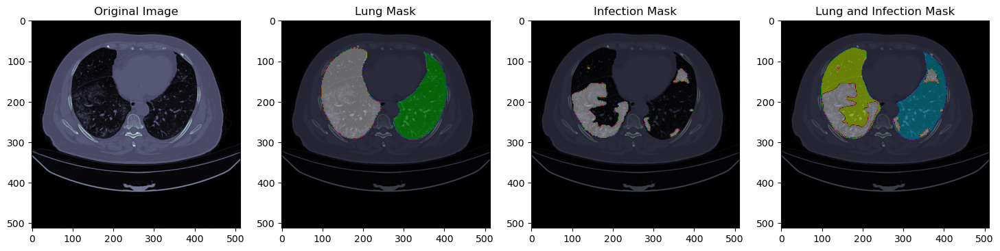

In [29]:
# Examine one slice of a ct scan and its annotations
plot_sample([sample_ct[...,120], sample_lung[...,120], sample_infe[...,120], sample_all[...,120]])

That's an example from a single slice, lets do the same for multiple slices in the same exam.

In [30]:
def bulk_plot_sample(array_list, index_list):
    '''
    Plots multiple slices, wrapper of plot_sample
    '''
    for index_value in index_list:
        plot_sample([array_list[0][...,index_value], array_list[1][...,index_value], array_list[2][...,index_value], array_list[3][...,index_value]])

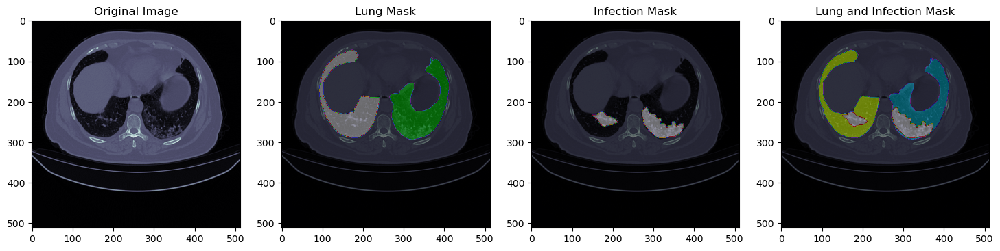

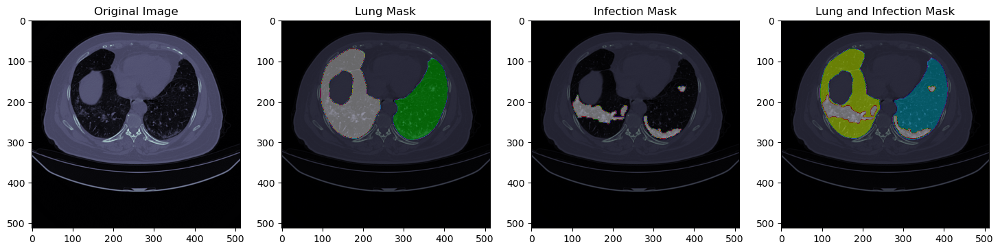

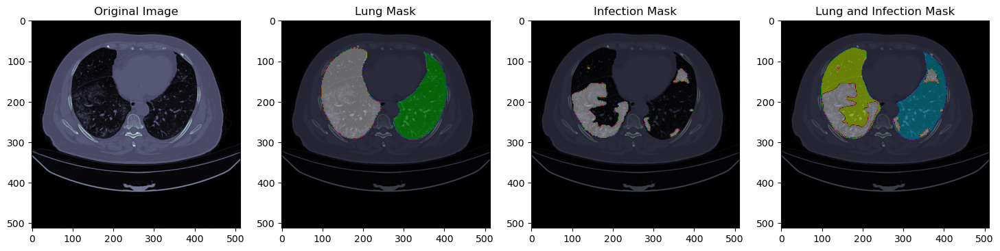

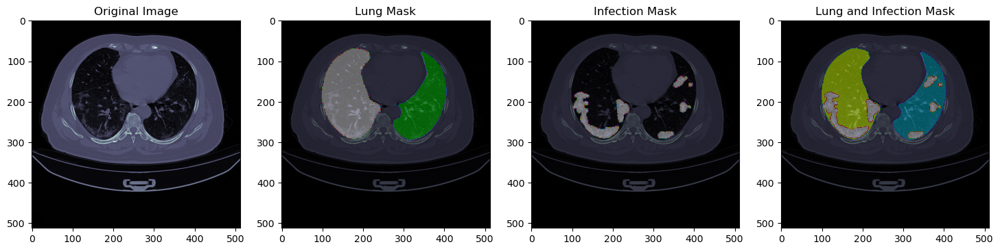

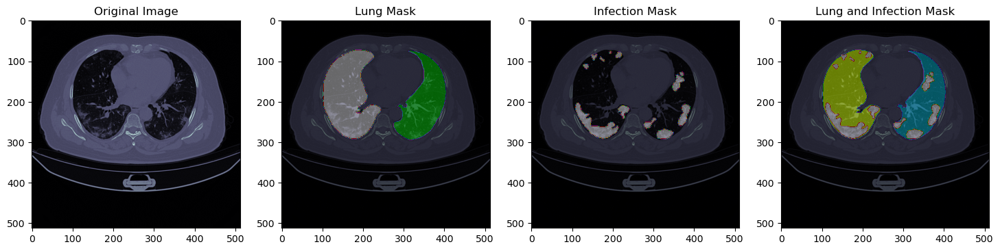

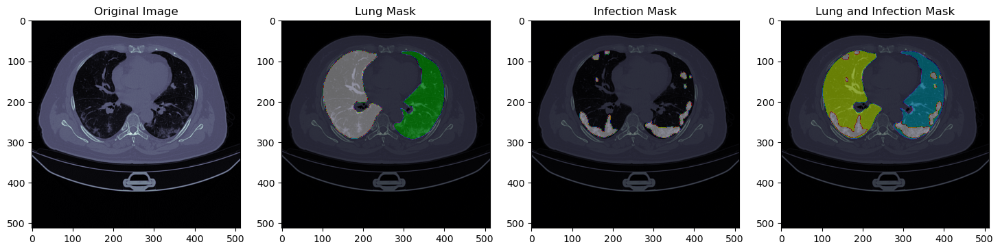

In [31]:
# Examine multiple slices of a ct scan and its annotations
bulk_plot_sample([sample_ct, sample_lung, sample_infe, sample_all], index_list=[100,110,120,130,140,150])

From here on you should be able to model the data to your hearts content!

For any requests let me know here in this kernel or in the discussion.

Thank you!

## Image processing

In [32]:
#Data handling
import pandas  as pd                          # already imported above
import numpy   as np                          # already imported above
import matplotlib.pyplot as plt               # already imported above
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans, MeanShift
from sklearn.model_selection import train_test_split

#Image loading and processing
import nibabel as nib                         # already imported above
import cv2
import imgaug as ia
import imgaug.augmenters as iaa

#File system handling
import glob                                    # already imported above
from zipfile import ZipFile                     # Not used
from shutil import copyfile, copyfileobj        # Not used
import gzip                                     # Not used
import os
from pylab import rcParams
#from google.colab import drive                 #Only useful if we are doing this in colab or from colab
#from google.colab import files                 #Only useful if we are doing this in colab or from colab

#Data Analysis and Machine Learning
import tensorflow as tf
from tensorflow.keras import layers, models
import scipy


print("Tensor Flow Version: ", tf.__version__)
print("Eager mode: ", tf.executing_eagerly())
print("GPU is", "available" if tf.config.experimental.list_physical_devices("GPU") else "NOT AVAILABLE")

Tensor Flow Version:  2.10.0
Eager mode:  True
GPU is available


In [33]:
import sys
import random
import warnings
import math
import seaborn as sns; sns.set()

from tqdm import tqdm_notebook, tnrange
from itertools import chain
from skimage.io import imread, imshow, concatenate_images
from skimage.transform import resize
from skimage.morphology import label

from tensorflow import keras
from keras.callbacks import Callback
from keras.losses import binary_crossentropy, sparse_categorical_crossentropy
from keras.models import Model, load_model
from keras.layers import Input, BatchNormalization, Activation, Dense, Dropout
from keras.layers.core import Lambda, RepeatVector, Reshape
from keras.layers.convolutional import Conv2D, Conv2DTranspose, Conv3D, Conv3DTranspose
from keras.layers.pooling import MaxPooling2D, GlobalMaxPool2D, MaxPooling3D, GlobalMaxPool3D
from keras.layers.merge import concatenate, add
from keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau, LearningRateScheduler
from keras.optimizers import Adam
from keras.preprocessing.image import ImageDataGenerator #,img_to_array, array_to_img , load_img are supposed to be in this mix but I got errors
from keras import backend as K

import joblib
import gc
import segmentation_models as sm

Segmentation Models: using `keras` framework.


In [34]:
import sys

print("User Python Current Version:-", sys.version)

User Python Current Version:- 3.7.13 (default, Mar 28 2022, 08:03:21) [MSC v.1916 64 bit (AMD64)]


## CLAHE and Cropping for image cleaning

In [35]:
def clahe_enhancer(test_img, demo):
    ''' CLAHE is contrast limited adaptive histogram equalization.  
    This will take local areas of an image and use an adaptive equalization
    of the brightness of the local area.  It will enhance edges and help 
    remove asymetric bright areas of an image improving the ability to see
    details within.'''

    test_img = test_img*255
    test_img = np.uint8(test_img)
    test_img_flattened = test_img.flatten()
  
    clahe = cv2.createCLAHE(clipLimit=3.0, tileGridSize=(8,8)) #Creates the CLAHE 8x8 pixel window
    clahe_image = clahe.apply(test_img)
    clahe_image_flattened = clahe_image.flatten()

    if demo == 1: #demo mode allows us to visualize how the CLAHE method is improving things

        fig = plt.figure()
        rcParams['figure.figsize'] = 10,10

        plt.subplot(2, 2, 1)
        plt.imshow(test_img, cmap='bone')
        plt.title("Original CT-Scan")

        plt.subplot(2, 2, 2)
        plt.hist(test_img_flattened)
        plt.title("Histogram of Original CT-Scan")

        plt.subplot(2, 2, 3)
        plt.imshow(clahe_image, cmap='bone')
        plt.title("CLAHE Enhanced CT-Scan")

        plt.subplot(2, 2, 4)
        plt.hist(clahe_image_flattened)
        plt.title("Histogram of CLAHE Enhanced CT-Scan")

    return(clahe_image)

In [36]:
def cropper(test_img, demo):
    ''' The cropper is a way to remove balck space in "uninteresting" areas of an image so we can
    save on computing and memory for doing our analysis.  We are only in this instance interested
    in the lungs for example."'''

    test_img = test_img*255
    test_img = np.uint8(test_img)

    ret, thresh = cv2.threshold(test_img, 50, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU) 
    ret, thresh = cv2.threshold(test_img, ret, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU) 

    contours,hierarchy = cv2.findContours(test_img, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    areas = [cv2.contourArea(c) for c in contours]

    x = np.argsort(areas)

    max_index = x[x.size - 1]
    cnt1=contours[max_index]
    second_max_index = x[x.size - 2]
    cnt2 = contours[second_max_index]
    
    cropped_image_flattened = test_img.flatten()


    # max_index = np.argmax(areas)
    # cnt=contours[max_index]

    x,y,w,h = cv2.boundingRect(cnt1)
    p,q,r,s = cv2.boundingRect(cnt2)

    cropped1 = test_img[y:y+h, x:x+w]
    cropped1 = cv2.resize(cropped1, dsize=(125,250), interpolation=cv2.INTER_AREA)
    cropped2 = test_img[q:q+s, p:p+r]
    cropped2 = cv2.resize(cropped2, dsize=(125,250), interpolation=cv2.INTER_AREA)

    fused = np.concatenate((cropped1, cropped2), axis=1)

    # super_cropped = test_img[y+7:y+h-20, x+25:x+w-25]
    points_lung1 = []
    points_lung2 = []

    points_lung1.append(x); points_lung1.append(y); points_lung1.append(w); points_lung1.append(h)
    points_lung2.append(p); points_lung2.append(q); points_lung2.append(r); points_lung2.append(s)

    if demo == 1:

        fig = plt.figure()
        from pylab import rcParams
        rcParams['figure.figsize'] = 35, 35

        plt.subplot(1, 3, 1)
        plt.imshow(test_img, cmap='bone')
        plt.title("Cropped CT-Scan")

        plt.subplot(1, 3, 2)
        plt.imshow(thresh, cmap='bone')
        plt.title("Binary Mask")
        
        #plt.subplot(1, 3, 3)
        #plt.imshow(fused, cmap='bone')
        #plt.title("Fused Image")

    #     plt.show()

    return(fused, points_lung1, points_lung2)

* Total slices are 3520. These have been sliced out by 20% in the front and by 20% in the last of each file since in general these didn't had any infection masks and some didn't had the lungs, removed as noise. This level could be adjusted too.

In [37]:
# Image Size is the preferred size of image that you wish to work with.
# This is because some of the images are 512x512 and the others are 630x630 and we need to standardize.
img_size = 512

* The other issue is with the training data some of the CT's take an image every 1 micron others every 6.  So when we import this we need to resize the data so it's all the same size and shape.
* Lastly it appears that some of the data is 16bit and the rest is an 8 bit B&W image.  

In [38]:
all_points1 = []
all_points2 = []

def read_nii(filepath, data, string):
    '''
    Reads .nii file and returns pixel array.  The filepath is where the data is, data is where it's stored
    and lastly the string is used to separate different methods for lungs, raw CT and infection masks
    '''
    global all_points1
    global all_points2
    ct_scan = nib.load(filepath)
    array   = ct_scan.get_fdata()
    array   = np.rot90(np.array(array)) # The images are rotated 90 degrees so we rotate them.
    slices = array.shape[2]
    array = array[:,:,round(slices*0.1):round(slices*0.9)] # takes off the top and bottom 10%
    array = np.reshape(np.rollaxis(array, 2),(array.shape[2],array.shape[0],array.shape[1],1))
    #print(array.shape[2])
    #array = skimage.transform.resize(array, (array.shape[2], img_size, img_size))
    #array = cv2.resize(array, dsize=(img_size, img_size), interpolation=cv2.INTER_CUBIC)
    

    if string == "lungs":
        all_points1 = []
        all_points2 = []

    for img_no in range(0, array.shape[0]):
        if string == 'lungs' and np.unique(array[img_no]).size == 1:
            continue
        img = cv2.resize(array[img_no], dsize=(img_size, img_size), interpolation=cv2.INTER_AREA)
        xmax, xmin = img.max(), img.min()
        img = (img - xmin)/(xmax - xmin)

        if string == 'lungs': # not sure what this is doing but it's not working.
            #img = np.uint8(img*255) 
            img[img>0]=1
            img, points1, points2 = cropper(img, demo = 0)
            all_points1.append((points1[0], points1[1], points1[2], points1[3]))
            all_points2.append((points2[0], points2[1], points2[2], points2[3]))
            continue 

            
        if string == "cts" and img_no < len(all_points1):
            img = clahe_enhancer(img, demo = 0)
            # img, points1, points2 = cropper(img, demo = 0)
            # all_points1.append((points1[0], points1[1], points1[2], points1[3]))
            # all_points2.append((points2[0], points2[1], points2[2], points2[3]))   
            a,b,c,d = all_points1[img_no]
            e,f,g,h = all_points2[img_no]
            img1 = img[b:b+d, a:a+c]
            img1 = cv2.resize(img1, dsize=(125,250), interpolation=cv2.INTER_AREA) # Resize the axis to 250
            img2 = img[f:f+h, e:e+g]
            img2 = cv2.resize(img2, dsize=(125,250), interpolation=cv2.INTER_AREA) # Resize the other axis 250
            img = np.concatenate((img1, img2), axis=1)    

        if string == "infections" and img_no < len(all_points1):
            a,b,c,d = all_points1[img_no]
            e,f,g,h = all_points2[img_no]
            img = np.uint8(img*255)
            img1 = img[b:b+d, a:a+c]
            img1 = cv2.resize(img1, dsize=(125,250), interpolation=cv2.INTER_AREA)
            img2 = img[f:f+h, e:e+g]
            img2 = cv2.resize(img2, dsize=(125,250), interpolation=cv2.INTER_AREA)
            img = np.concatenate((img1, img2), axis=1)


        # img = cv2.resize(img, dsize=(192, 192), interpolation=cv2.INTER_LINEAR)
        # img = img/255
        #  remember to normalize again
        # also resize images and masks for all
        
        data.append(img)

In [39]:
# Some lists to hold the different groups of images CTS is the raw file, Lungs is lung mask, Infection is infection mask
cts = []
lungs = []
infections = []

In [40]:
for i in range(0, 20):
    read_nii(raw_data.loc[i,'lung_mask'], lungs, 'lungs')
    read_nii(raw_data.loc[i,'ct_scan'], cts, 'cts') 
    read_nii(raw_data.loc[i,'infection_mask'], infections, 'infections')

C:\ProgramData\Anaconda3\envs\Covid_19_X_Rays\lib\site-packages\ipykernel_launcher.py:31: RuntimeWarning: invalid value encountered in true_divide


In [41]:
print("cts shape:",np.shape(cts))
print("infections shape:",np.shape(infections))
print("lungs shape:",np.shape(lungs))

cts shape: (2816,)
infections shape: (2816,)
lungs shape: (0,)


C:\ProgramData\Anaconda3\envs\Covid_19_X_Rays\lib\site-packages\numpy\core\fromnumeric.py:1970: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  result = asarray(a).shape


<p color='red'>Lungs folder isn't working... this method is for infection & CT only.</p>

* The issue with this data is that it pools all the slungs into one variable.  This is okay for 2D analysis but we may need to do this in 3D

In [22]:
def read_nii_demo(filepath, data):
    '''
    Reads .nii file and returns pixel array
    '''
    ct_scan = nib.load(filepath)
    array   = ct_scan.get_fdata()
    array   = np.rot90(np.array(array))
    slices = array.shape[2]
    array = array[:,:,round(slices*0.1):round(slices*0.9)] # takes off the top and bottom 10%
    array = np.reshape(np.rollaxis(array, 2),(array.shape[2],array.shape[0],array.shape[1], 1))

    for img_no in range(0, array.shape[0]):
        # array = Image.resize(array[...,img_no], (img_size,img_size))
        img = cv2.resize(array[img_no], dsize=(250, 250), interpolation=cv2.INTER_AREA)
        xmax, xmin = img.max(), img.min()
        img = (img - xmin)/(xmax - xmin)
        data.append(img)

In [23]:
# Some lists to hold the different groups of images CTS is the raw file, Lungs is lung mask, Infection is infection mask
cts_3D = []
lungs_3D = []
infections_3D = []

In [24]:
for i in range(0, 20):
    read_nii_demo(raw_data.loc[i,'lung_mask'], lungs_3D)
    read_nii_demo(raw_data.loc[i,'infection_mask'], infections_3D) 
    read_nii_demo(raw_data.loc[i,'ct_scan'], cts_3D) 

C:\ProgramData\Anaconda3\envs\Covid_19_X_Rays\lib\site-packages\ipykernel_launcher.py:16: RuntimeWarning: invalid value encountered in true_divide
  


In [25]:
print("cts shape:",np.shape(cts_3D))
print("infections shape:",np.shape(infections_3D))
print("lungs shape:",np.shape(lungs_3D))

cts shape: (2816, 250, 250)
infections shape: (2816, 250, 250)
lungs shape: (2816, 250, 250)


In [26]:
no_masks = []
for i in range(0, len(lungs_3D)):
    if np.unique(lungs_3D[i]).size == 1:
        no_masks.append(i)
print("Number of complete black masks :" , len(no_masks))

Number of complete black masks : 83


This works giving us the full 3D version of the data, but we the data isn't cropped and I haven't flattened out the data to process it all at once like the previous method.

### The following is a fully processed sample of raw CT and Infection mask compared side by side

(250, 250) (250, 250)


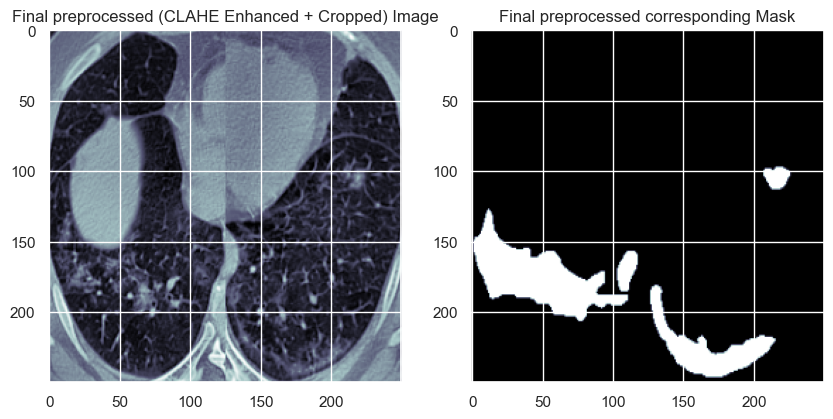

In [27]:
x = 80
rcParams['figure.figsize'] = 10,10

plt.subplot(1, 2, 1)
plt.imshow(cts[x], cmap='bone')
plt.title("Final preprocessed (CLAHE Enhanced + Cropped) Image")

plt.subplot(1, 2, 2)
plt.imshow(infections[x], cmap='bone')
plt.title("Final preprocessed corresponding Mask")

print(cts[x].shape, infections[x].shape)

(250, 250) (250, 250)


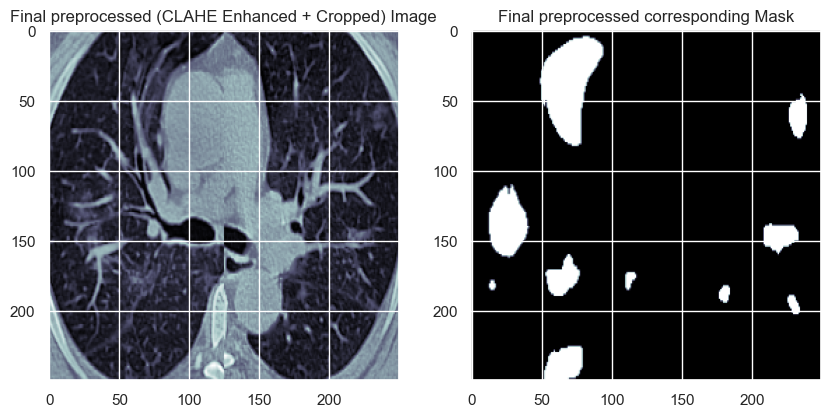

In [28]:
x = 120
rcParams['figure.figsize'] = 10,10

plt.subplot(2, 2, 1)
plt.imshow(cts[160], cmap='bone')
plt.title("Final preprocessed (CLAHE Enhanced + Cropped) Image")

plt.subplot(2, 2, 2)
plt.imshow(infections[160], cmap='bone')
plt.title("Final preprocessed corresponding Mask")

#plt.subplot(2, 2, 3)
#plt.imshow(lungs[80], cmap='bone')
#plt.title("Lung  Mask")
print(cts[x].shape, infections[x].shape)

In [29]:
no_masks = []
for i in range(0, len(infections)):
    if np.unique(infections[i]).size == 1:
        no_masks.append(i)
print("Number of complete black masks :" , len(no_masks))

for index in sorted(no_masks, reverse = True):  
    del infections[index]  
    del cts[index]

Number of complete black masks : 1006


Looking at this it appears that ~1000 slices were of complete black masks i.e. no infection.

### Using CLAHE adaptive histogram to clean image for improved analysis.

* Following is the demo for the CLAHE enhanced images with histograms.  This stands for **C**ontrast **L**imitd **A**daptive **H**istogram **E**qualization.
* This enhances local contrast but limits the adaptive histogram equalization to not over amplify signal.
* Notice how the seahorse shaped infection in the left lung can be distinguised clearly after enhancement.

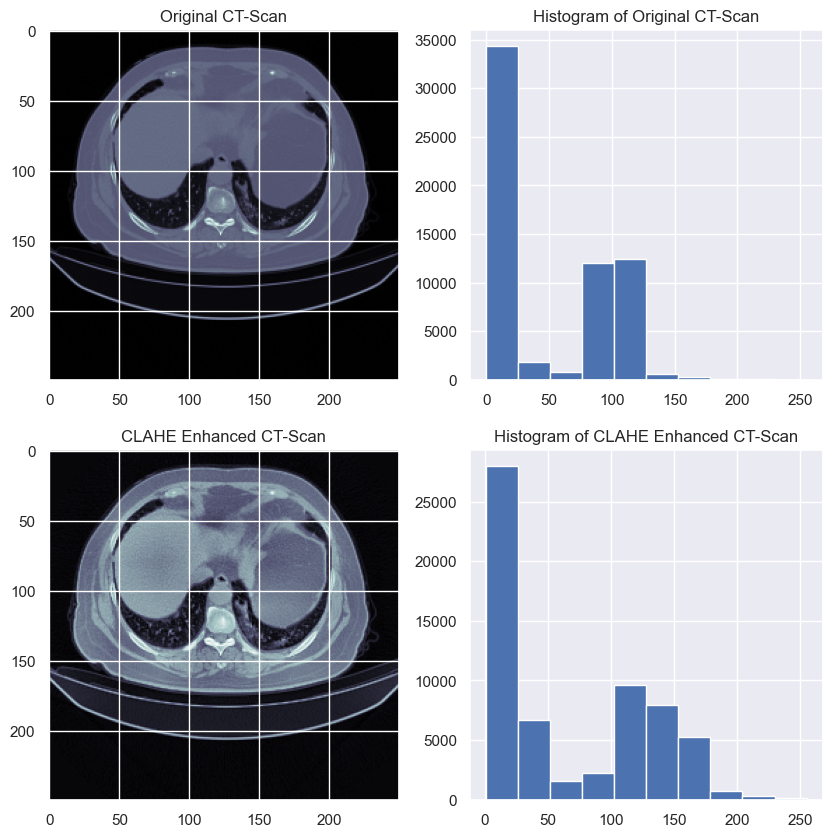

In [30]:
test_file = []
read_nii_demo(raw_data.loc[0,'ct_scan'], test_file)
test_file = np.array(test_file)
rcParams['figure.figsize'] = 10, 10
clahe_image = clahe_enhancer(test_file[60], demo = 1)

In [31]:
print(len(cts) , len(infections))

1810 1810


In [32]:
dim1=[]
dim2=[]
for i in range(0, len(cts)):
    dim1.append(cts[i].shape[0])
    dim2.append(cts[i].shape[1])
dim1 = np.array(dim1)
dim2 = np.array(dim2)

print("An idea about the new net dimension to which all must be resized to \n(some will increase and some decrease) --->", np.median(dim1),'x', np.median(dim2))

An idea about the new net dimension to which all must be resized to 
(some will increase and some decrease) ---> 250.0 x 250.0


### Changing image dimensions to improve computational preformance

* I used median of the all width and height but couldn't fit the RAM so reduced the size to 224, though images with larger resolution with more clear features will possibly give better results on the same model.

In [33]:
new_dim = 224
for i in range(0,len(cts)):
    cts[i] = cv2.resize(cts[i], dsize=(new_dim, new_dim), interpolation=cv2.INTER_LINEAR)
  # cts[i] = cts[i]/255 # this is to normalize the data to be between 0-255, but I do it later so it's commented out here
    infections[i] = cv2.resize(infections[i], dsize=(new_dim, new_dim), interpolation=cv2.INTER_LINEAR)
  # infections[i] = infections[i]/255 # this is to normalize the data to be between 0-255, but I do it later so it's commented out here

In [34]:
# Saving the numpy arrays to later reuse the same preprocessing for other models rather than doing it again and again.
cts = np.array(cts)
infections = np.array(infections)

cts = np.uint8(cts)
infections = np.uint8(infections)

In [35]:
print(cts.shape)
print(lungs.shape)
print(infections.shape)

(1810, 224, 224)


AttributeError: 'list' object has no attribute 'shape'

## Saving our images

In [36]:
joblib.dump(cts, 'cts_cropped_lungs_224.pkl')

['cts_cropped_lungs_224.pkl']

In [37]:
joblib.dump(infections, 'infections_cropped_lungs_224.pkl')

['infections_cropped_lungs_224.pkl']

In [38]:
joblib.dump(cts_3D, 'cts_cropped_lungs_3D.pkl')
joblib.dump(infections_3D, 'infections_cropped_lungs_3D.pkl')
joblib.dump(lungs_3D, 'lungs_cropped_lungs_3D.pkl')

['lungs_cropped_lungs_3D.pkl']

* Same process as above for the 3D version of image composition.

In [36]:
new_dim = 224
for i in range(0,len(cts)):
    cts_3D[i] = cv2.resize(cts_3D[i], dsize=(new_dim, new_dim), interpolation=cv2.INTER_LINEAR)
  # cts_3D[i] = cts_3D[i]/255
    infections_3D[i] = cv2.resize(infections_3D[i], dsize=(new_dim, new_dim), interpolation=cv2.INTER_LINEAR)
  # infections_3D[i] = infections_3D[i]/255
    lungs_3D[i] = cv2.resize(lungs_3D[i], dsize=(new_dim, new_dim), interpolation=cv2.INTER_LINEAR)
  # lungs_3D[i] = lungs_3D[i]/255

In [39]:
# Saving the numpy arrays to later reuse the same preprocessing for other models 
# rather than doing it again and again.
cts_3D = np.array(cts_3D, dtype='object')
infections_3D = np.array(infections_3D, dtype='object')
lungs_3D = np.array(lungs_3D, dtype='object')

In [40]:
print(cts_3D.shape)
print(lungs_3D.shape)
print(infections_3D.shape)

(2816,)
(2816,)
(2816,)


In [41]:
print(cts_3D[0].shape)
print(lungs_3D[0].shape)
print(infections_3D[0].shape)

(224, 224)
(224, 224)
(224, 224)


In [42]:
cts_3D = np.uint8(cts_3D)
infections_3D = np.uint8(infections_3D)
lungs_3D = np.uint8(lungs_3D)

ValueError: setting an array element with a sequence.

### Randomly flip and rotate the image. 

This is to ensure the detection works in different orientations which can be an issue with image detection if the images are all ligned up the same way.

In [42]:
sometimes = lambda aug: iaa.Sometimes(0.5, aug)

seq = iaa.Sequential([
    iaa.Fliplr(0.5), # horizontally flip 50% of all images
    iaa.Flipud(0.2), # vertically flip 20% of all images
    sometimes(iaa.Affine(
            scale={"x": (0.8, 1.2), "y": (0.8, 1.2)}, # scale images to 80-120% of their size, individually per axis
            translate_percent={"x": (-0.2, 0.2), "y": (-0.2, 0.2)}, # translate by -20 to +20 percent (per axis)
            rotate=(-40, 40), # rotate by -45 to +45 degrees
            shear=(-16, 16), # shear by -16 to +16 degrees
            # mode=ia.ALL # use any of scikit-image's warping modes (see 2nd image from the top for examples)
        ))
], random_order=True)

In [43]:
cts.shape

(1810, 224, 224)

In [44]:
no_of_aug_imgs = 200
random_indices = np.random.randint(0, cts.shape[0], size=no_of_aug_imgs)
sample_cts = cts[random_indices]
sample_inf = infections[random_indices]

In [ ]:
# sample_cts = np.floor(sample_cts)
# sample_inf = np.floor(sample_inf)
# sample_cts = np.uint64(sample_cts)
# sample_inf = np.uint64(sample_inf)

In [45]:
print('sample_cts shape=',sample_cts.shape)
print('sample_inf shape=',sample_inf.shape)

sample_cts shape= (200, 224, 224)
sample_inf shape= (200, 224, 224)


In [46]:
cts_aug, infections_aug = seq(images=sample_cts, segmentation_maps=sample_inf)

ValueError: Tried to convert an array to list of SegmentationMapsOnImage. Expected that array to be of shape (N,H,W,#SegmapsPerImage), i.e. 4-dimensional, but got 3 dimensions instead.

In [47]:
rcParams['figure.figsize'] = 60,60
rand = np.random.randint(0, no_of_aug_imgs, size=8)

cells1 = cts_aug[rand]
grid_image1 = np.hstack(cells1)
plt.imshow(grid_image1, cmap = 'bone')

NameError: name 'cts_aug' is not defined

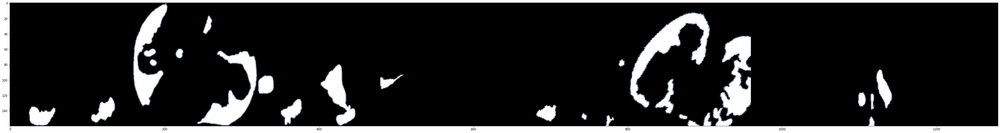

In [ ]:
cells2 = infections_aug[rand]
grid_image2 = np.hstack(cells2)
plt.imshow(grid_image2, cmap = 'bone')

In [ ]:
print(cts_aug.shape, infections_aug.shape)

(200, 160, 160) (200, 160, 160)


In [ ]:
# cts = np.concatenate((cts, cts_aug), axis=0)
# infections = np.concatenate((infections, infections_aug), axis = 0)
# np.random.shuffle(cts)
# np.random.shuffle(infections)
# print(cts.shape, infections.shape)

In [ ]:
cts_aug = cts_aug/255
infections_aug = infections_aug/255
cts_aug = cts_aug.reshape(len(cts_aug), new_dim, new_dim, 1)
infections_aug = infections_aug.reshape(len(infections_aug), new_dim, new_dim, 1)

## Data analysis

In [ ]:
# temp1 = joblib.load('cts_cropped_lungs_224.pkl')
# temp2 = joblib.load('infections_cropped_lungs_224.pkl')

In [49]:
# Normalizing the data
cts = cts/255
infections = infections/255

In [50]:
# Normalizing the data
cts_3D = cts_3D/255
lungs_3D = lungs_3D/255
infections_3D = infections_3D/255

In [51]:
# Separating out test vs training data
from sklearn.model_selection import train_test_split


cts = cts.reshape(len(cts), new_dim, new_dim, 1)
infections = infections.reshape(len(infections), new_dim, new_dim, 1)

x=cts # CLAHE enhanced cropped lung data for training
y=infections # Infection mask for testing

x_train, x_valid, y_train, y_valid = train_test_split(x, y, test_size=0.3, random_state=42) # random_state used for reproducibility
print(x_train.shape, x_valid.shape)
print(y_train.shape, y_valid.shape)

(1267, 224, 224, 1) (543, 224, 224, 1)
(1267, 224, 224, 1) (543, 224, 224, 1)


In [52]:
print(cts.shape)
print(cts_3D.shape)

(1810, 224, 224, 1)
(2816,)


In [53]:
for img_no in range(len(lungs_3D)):

    lung_img = lungs_3D[img_no]
    lung_img[lung_img>0]=1
    cropped_lung, points1, points2 = cropper(lung_img, demo = 0)
    new_lungs.append(cropped_lung)

    cts_img = cts_3D[img_no]
    cts_img = clahe_enhancer(cts_img, demo = 0)
    # img, points1, points2 = cropper(img, demo = 0)
    # all_points1.append((points1[0], points1[1], points1[2], points1[3]))
    # all_points2.append((points2[0], points2[1], points2[2], points2[3]))
    a,b,c,d = points1[0], points1[1], points1[2], points1[3]
    e,f,g,h = points2[0], points2[1], points2[2], points2[3]
    img1 = cts_img[b:b+d, a:a+c]
    img1 = cv2.resize(img1, dsize=(125,250), interpolation=cv2.INTER_AREA)
    img2 = cts_img[f:f+h, e:e+g]
    img2 = cv2.resize(img2, dsize=(125,250), interpolation=cv2.INTER_AREA)
    cropped_cts = np.concatenate((img1, img2), axis=1)
    new_cts.append(cropped_cts)

IndexError: index -1 is out of bounds for axis 0 with size 0

(Z,X,Y,C) as far as I can figure out.  But Z is actually all the images stacked together not caring if they are from one of the 20 images.

In [54]:
new_cts=[]
new_lungs=[]

In [55]:
# Lets take a look at these and images and see what we have
def plot_sample(array_list, color_map = 'nipy_spectral'):
    '''
    Plots and a slice with all available annotations
    '''
    fig = plt.figure(figsize=(10,30))

    plt.subplot(1,2,1)
    plt.imshow(array_list[0].reshape(new_dim, new_dim), cmap='bone')
    plt.title('Original Image')

    # plt.subplot(1,2,2)
    # plt.imshow(array_list[0], cmap='bone')
    # plt.imshow(array_list[1], alpha=0.5, cmap=color_map)
    # plt.title('Lung Mask')

    plt.subplot(1,2,2)
    plt.imshow(array_list[0].reshape(new_dim, new_dim), cmap='bone')
    plt.imshow(array_list[1].reshape(new_dim, new_dim), alpha=0.5, cmap=color_map)
    plt.title('Infection Mask')

    # plt.subplot(1,2,2)
    # plt.imshow(array_list[0].reshape(img_size,img_size), cmap='bone')
    # plt.imshow(array_list[1].reshape(img_size, img_size), alpha=0.5, cmap=color_map)
    # plt.title('Lung and Infection Mask')

#     plt.subplot(1,4,4)
#     plt.imshow(array_list[0], cmap='bone')
#     plt.imshow(array_list[3], alpha=0.5, cmap=color_map)
#     plt.title('Lung and Infection Mask')

    plt.show()

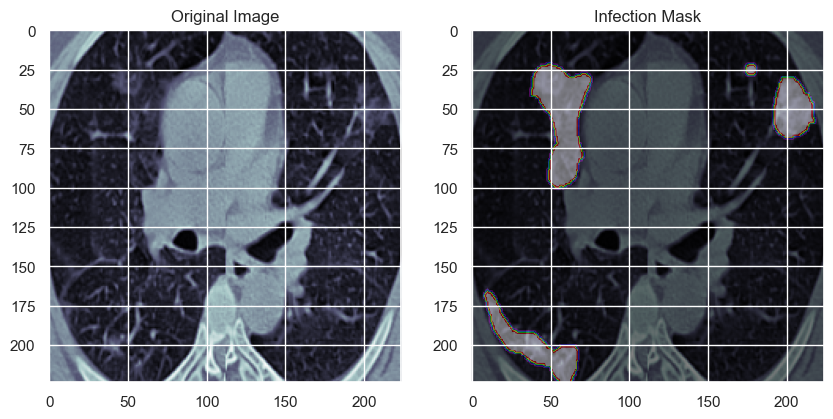

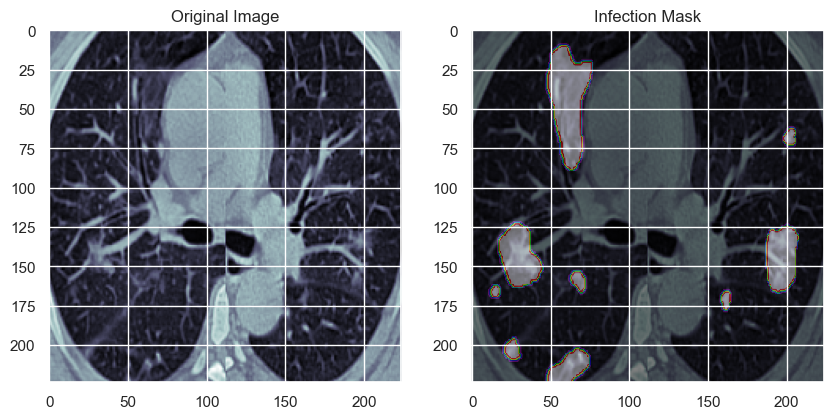

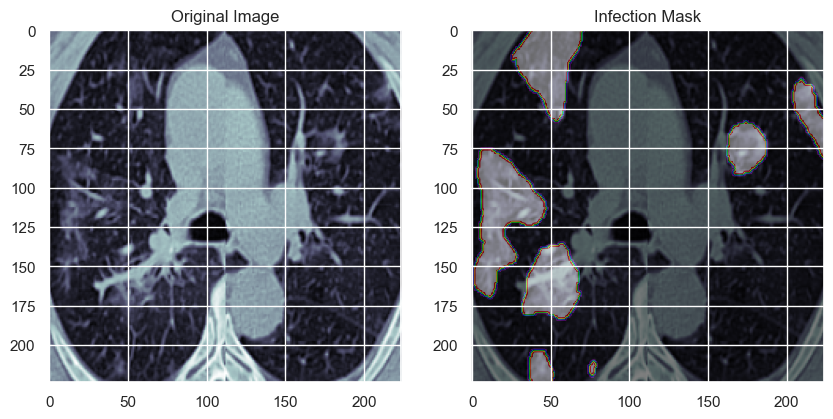

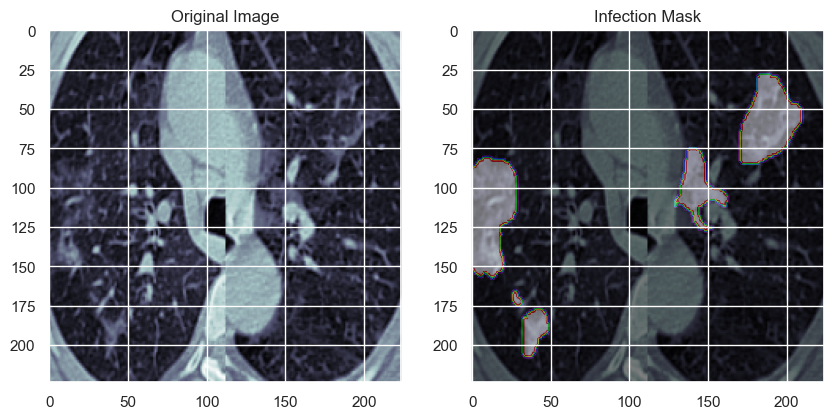

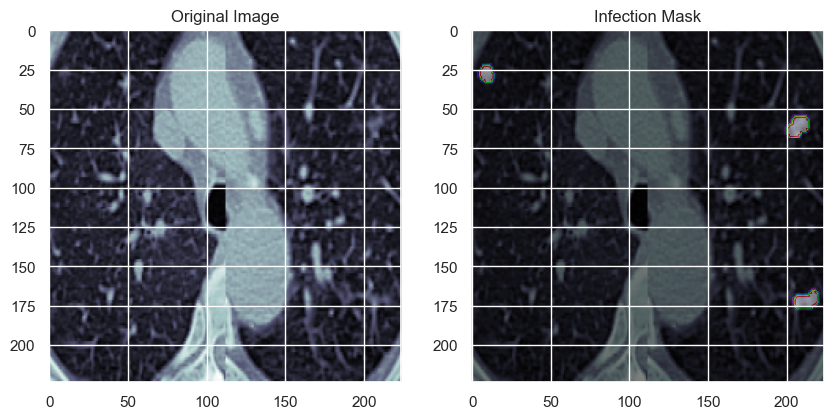

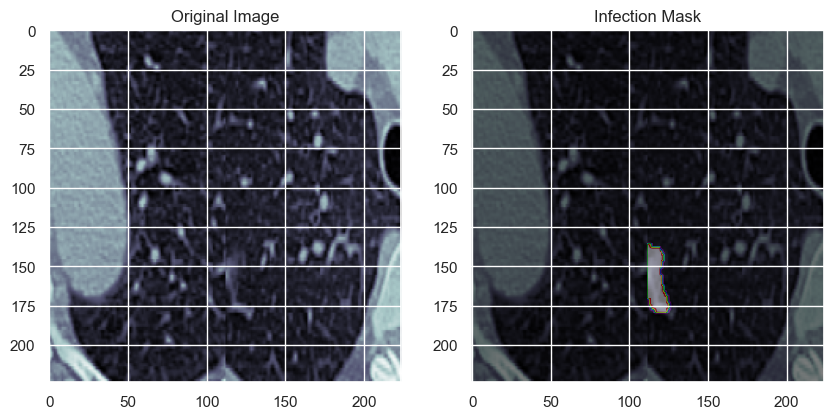

In [56]:
for index in [100,110,120,130,140,150]:
    plot_sample([cts[index], infections[index]])

## 2D Infection Mask Training

Here we are training to the infection mask to teach our algorithm to learn how to identify and segment the infected areas of the lung for further analysis

#### Deadsckull7's methodology

In [57]:
# Some preformance metrics
def dice_coeff(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    loss = 1 - dice_coeff(y_true, y_pred)
    return loss


def bce_dice_loss(y_true, y_pred):
    loss = 0.5*binary_crossentropy(y_true, y_pred) + 0.5*dice_loss(y_true, y_pred)
    return loss

def tversky_loss(y_true, y_pred):
    alpha = 0.5
    beta  = 0.5
    
    ones = K.ones(K.shape(y_true))
    p0 = y_pred      # proba that voxels are class i
    p1 = ones-y_pred # proba that voxels are not class i
    g0 = y_true
    g1 = ones-y_true
    
    num = K.sum(p0*g0, (0,1,2))
    den = num + alpha*K.sum(p0*g1,(0,1,2)) + beta*K.sum(p1*g0,(0,1,2))
    
    T = K.sum(num/den) # when summing over classes, T has dynamic range [0 Ncl]
    
    Ncl = K.cast(K.shape(y_true)[-1], 'float32')
    return Ncl-T

def weighted_bce_loss(y_true, y_pred, weight):
    epsilon = 1e-7
    y_pred = K.clip(y_pred, epsilon, 1. - epsilon)
    logit_y_pred = K.log(y_pred / (1. - y_pred))
    loss = weight * (logit_y_pred * (1. - y_true) + 
                     K.log(1. + K.exp(-K.abs(logit_y_pred))) + K.maximum(-logit_y_pred, 0.))
    return K.sum(loss) / K.sum(weight)

def weighted_dice_loss(y_true, y_pred, weight):
    smooth = 1.
    w, m1, m2 = weight, y_true, y_pred
    intersection = (m1 * m2)
    score = (2. * K.sum(w * intersection) + smooth) / (K.sum(w * m1) + K.sum(w * m2) + smooth)
    loss = 1. - K.sum(score)
    return loss

def weighted_bce_dice_loss(y_true, y_pred):
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    # if we want to get same size of output, kernel size must be odd
    averaged_mask = K.pool2d(
            y_true, pool_size=(50, 50), strides=(1, 1), padding='same', pool_mode='avg')
    weight = K.ones_like(averaged_mask)
    w0 = K.sum(weight)
    weight = 5. * K.exp(-5. * K.abs(averaged_mask - 0.5))
    w1 = K.sum(weight)
    weight *= (w0 / w1)
    loss = 0.5*weighted_bce_loss(y_true, y_pred, weight) + 0.5*dice_loss(y_true, y_pred)
    return loss

In [58]:
inputs = Input((new_dim, new_dim, 1)) #Makes a (224,224,1) Input shape tensor for convolving
# s = Lambda(lambda x: x / 255) (inputs)

# def mish(inputs):
#     return inputs * tf.math.tanh(tf.math.softplus(inputs))
    
c1 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (inputs)
c1 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c1)
c1 = BatchNormalization()(c1)  # Normalizes the data
p1 = MaxPooling2D((2, 2)) (c1) # Reduces data size for computation ease and removing non critical values for further down.
p1 = Dropout(0.25)(p1)   # Drops out 20% of the connections randomly during training to prevent overfitting

c2 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (p1)
c2 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c2)
c2 = BatchNormalization()(c2)
p2 = MaxPooling2D((2, 2)) (c2)
p2 = Dropout(0.25)(p2)

c3 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (p2)
c3 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c3)
c3 = BatchNormalization()(c3)
p3 = MaxPooling2D((2, 2)) (c3)
p3 = Dropout(0.25)(p3)

c4 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (p3)
c4 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c4)
c4 = BatchNormalization()(c4)
p4 = MaxPooling2D(pool_size=(2, 2)) (c4)
p4 = Dropout(0.25)(p4)

c5 = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (p4)
c5 = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c5)

u6 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = concatenate([u6, c4])
u6 = BatchNormalization()(u6)
c6 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (u6)
c6 = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c6)


u7 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = concatenate([u7, c3])
u7 = BatchNormalization()(u7)
c7 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (u7)
c7 = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c7)


u8 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c2])
u8 = BatchNormalization()(u8)
c8 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (u8)
c8 = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c8)


u9 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c1], axis=3)
u9 = BatchNormalization()(u9)
c9 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (u9)
c9 = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (c9)

outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)

model = Model(inputs=[inputs], outputs=[outputs], name='sigmoid_model')
model.summary()

Model: "sigmoid_model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 224, 224, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_68 (Conv2D)             (None, 224, 224, 32  320         ['input_5[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_69 (Conv2D)             (None, 224, 224, 32  9248        ['conv2d_68[0][0]']              
                                )                                                     

### My Methodology attempts

In [59]:
# Model 2 Using softplus activation instead of relu to ensure a probability distribution of the data 
# and no "dead neurons" which occur in RelU 
inputs = Input((new_dim, new_dim, 1)) #Makes a tensor for convolving
    
c1 = Conv2D(32, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (inputs)
c1 = Conv2D(32, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (c1)
c1 = BatchNormalization()(c1)  # Normalizes the data
p1 = MaxPooling2D((2, 2)) (c1) # pulls the data by averageing a 2x2 block 
p1 = Dropout(0.25)(p1)   # Drops out 25% of the connections randomly during training to prevent overfitting

c2 = Conv2D(64, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (p1)
c2 = Conv2D(64, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (c2)
c2 = BatchNormalization()(c2) # Do I really need to normalize this more than once?  We can test this, and maybe speed things up a bit
p2 = MaxPooling2D((2, 2)) (c2)
p2 = Dropout(0.25)(p2)

c3 = Conv2D(128, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (p2)
c3 = Conv2D(128, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (c3)
c3 = BatchNormalization()(c3)
p3 = MaxPooling2D((2, 2)) (c3)
p3 = Dropout(0.25)(p3)

c4 = Conv2D(256, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (p3)
c4 = Conv2D(256, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (c4)
c4 = BatchNormalization()(c4)
p4 = MaxPooling2D(pool_size=(2, 2)) (c4)
p4 = Dropout(0.25)(p4)

c5 = Conv2D(512, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (p4)
c5 = Conv2D(512, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (c5)

u6 = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same')(c5)
u6 = concatenate([u6, c4])
u6 = BatchNormalization()(u6)
c6 = Conv2D(256, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (u6)
c6 = Conv2D(256, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (c6)


u7 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (c6)
u7 = concatenate([u7, c3])
u7 = BatchNormalization()(u7)
c7 = Conv2D(128, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (u7)
c7 = Conv2D(128, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (c7)


u8 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (c7)
u8 = concatenate([u8, c2])
u8 = BatchNormalization()(u8)
c8 = Conv2D(64, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (u8)
c8 = Conv2D(64, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (c8)


u9 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (c8)
u9 = concatenate([u9, c1], axis=3)
u9 = BatchNormalization()(u9)
c9 = Conv2D(32, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (u9)
c9 = Conv2D(32, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (c9)

outputs = Conv2D(1, (1, 1), activation='sigmoid') (c9)

model_2 = Model(inputs=[inputs], outputs=[outputs], name='softplus_model')
model_2.summary()

Model: "softplus_model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_6 (InputLayer)           [(None, 224, 224, 1  0           []                               
                                )]                                                                
                                                                                                  
 conv2d_87 (Conv2D)             (None, 224, 224, 32  320         ['input_6[0][0]']                
                                )                                                                 
                                                                                                  
 conv2d_88 (Conv2D)             (None, 224, 224, 32  9248        ['conv2d_87[0][0]']              
                                )                                                    

In [60]:
# Model 3 Similar to model 2 but the layers are not connected liniarly. 
# This is faster.
inputs = Input((new_dim, new_dim, 1)) #Makes a tensor for convolving
    
x = Conv2D(32, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (inputs)
x = Conv2D(32, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (x)
x = BatchNormalization()(x)  # Normalizes the data
x = MaxPooling2D((2, 2))(x)  # pulls the data by averageing a 2x2 block 
x = Dropout(0.25)(x)   # Drops out 25% of the connections randomly during training to prevent overfitting

x = Conv2D(64, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (x)
x = Conv2D(64, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2)) (x)
x = Dropout(0.25)(x)

x = Conv2D(128, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (x)
x = Conv2D(128, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2)) (x)
x = Dropout(0.25)(x)

x = Conv2D(256, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (x)
x = Conv2D(256, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (x)
x = BatchNormalization()(x)
x = MaxPooling2D(pool_size=(2, 2)) (x)
x = Dropout(0.25)(x)

x = Conv2D(512, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (x)
x = Conv2D(512, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (x)

x = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same') (x)
x = Conv2D(256, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (x)

x = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (x)
x = Conv2D(128, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (x)

x = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (x)
x = Conv2D(64, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (x)

x = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (x)
x = Conv2D(32, (3, 3), activation='softplus', padding='same', kernel_initializer="he_normal") (x)

outputs = Conv2D(1, (1, 1), activation='sigmoid') (x)

model_3 = Model(inputs=[inputs], outputs=[outputs], name='softplus_model')
model_3.summary()

Model: "softplus_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_7 (InputLayer)        [(None, 224, 224, 1)]     0         
                                                                 
 conv2d_106 (Conv2D)         (None, 224, 224, 32)      320       
                                                                 
 conv2d_107 (Conv2D)         (None, 224, 224, 32)      9248      
                                                                 
 batch_normalization_40 (Bat  (None, 224, 224, 32)     128       
 chNormalization)                                                
                                                                 
 max_pooling2d_24 (MaxPoolin  (None, 112, 112, 32)     0         
 g2D)                                                            
                                                                 
 dropout_24 (Dropout)        (None, 112, 112, 32)   

In [61]:
# Model 4 Similar to model 1 but the layers are not connected liniarly. 
# This is faster.
inputs = Input((new_dim, new_dim, 1)) #Makes a tensor for convolving
    
x = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (inputs)
x = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)
x = BatchNormalization()(x)  # Normalizes the data
x = MaxPooling2D((2, 2))(x)  # pulls the data by averageing a 2x2 block 
x = Dropout(0.25)(x)   # Drops out 25% of the connections randomly during training to prevent overfitting

x = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)
x = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2)) (x)
x = Dropout(0.25)(x)

x = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)
x = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)
x = BatchNormalization()(x)
x = MaxPooling2D((2, 2)) (x)
x = Dropout(0.25)(x)

x = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)
x = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)
x = BatchNormalization()(x)
x = MaxPooling2D(pool_size=(2, 2)) (x)
x = Dropout(0.25)(x)

x = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)
x = Conv2D(512, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)

x = Conv2DTranspose(256, (2, 2), strides=(2, 2), padding='same') (x)
x = Conv2D(256, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)

x = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same') (x)
x = Conv2D(128, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)

x = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same') (x)
x = Conv2D(64, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)

x = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same') (x)
x = Conv2D(32, (3, 3), activation='relu', padding='same', kernel_initializer="he_normal") (x)

outputs = Conv2D(1, (1, 1), activation='sigmoid') (x)

model_4 = Model(inputs=[inputs], outputs=[outputs], name='relu_model')
model_4.summary()

Model: "relu_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_8 (InputLayer)        [(None, 224, 224, 1)]     0         
                                                                 
 conv2d_121 (Conv2D)         (None, 224, 224, 32)      320       
                                                                 
 conv2d_122 (Conv2D)         (None, 224, 224, 32)      9248      
                                                                 
 batch_normalization_44 (Bat  (None, 224, 224, 32)     128       
 chNormalization)                                                
                                                                 
 max_pooling2d_28 (MaxPoolin  (None, 112, 112, 32)     0         
 g2D)                                                            
                                                                 
 dropout_28 (Dropout)        (None, 112, 112, 32)      0

In [62]:
class CosineAnnealingScheduler(Callback):
    """Cosine annealing scheduler.
    This will start with a high learning rate and rapidly lower it before ramping it back up again.
    By doing this we can retest good weights that were lost when the learning rate was changed.
    """

    def __init__(self, T_max, eta_max, eta_min=0, verbose=1):
        super(CosineAnnealingScheduler, self).__init__()
        self.T_max = T_max
        self.eta_max = eta_max
        self.eta_min = eta_min
        self.verbose = verbose

    def on_epoch_begin(self, epoch, logs=None):
        if not hasattr(self.model.optimizer, 'lr'):
            raise ValueError('Optimizer must have a "lr" attribute.')
        lr = self.eta_min + (self.eta_max - self.eta_min) * (1 + math.cos(math.pi * epoch / self.T_max)) / 2
        K.set_value(self.model.optimizer.lr, lr)
        print('\nEpoch %05d: CosineAnnealingScheduler setting learning ''rate to %s.' % (epoch + 1, lr))

    def on_epoch_end(self, epoch, logs=None):
        logs = logs or {}
        logs['lr'] = K.get_value(self.model.optimizer.lr)

In [63]:
cosine_annealer = CosineAnnealingScheduler(T_max=7, eta_max=0.0005, eta_min=0.0001)

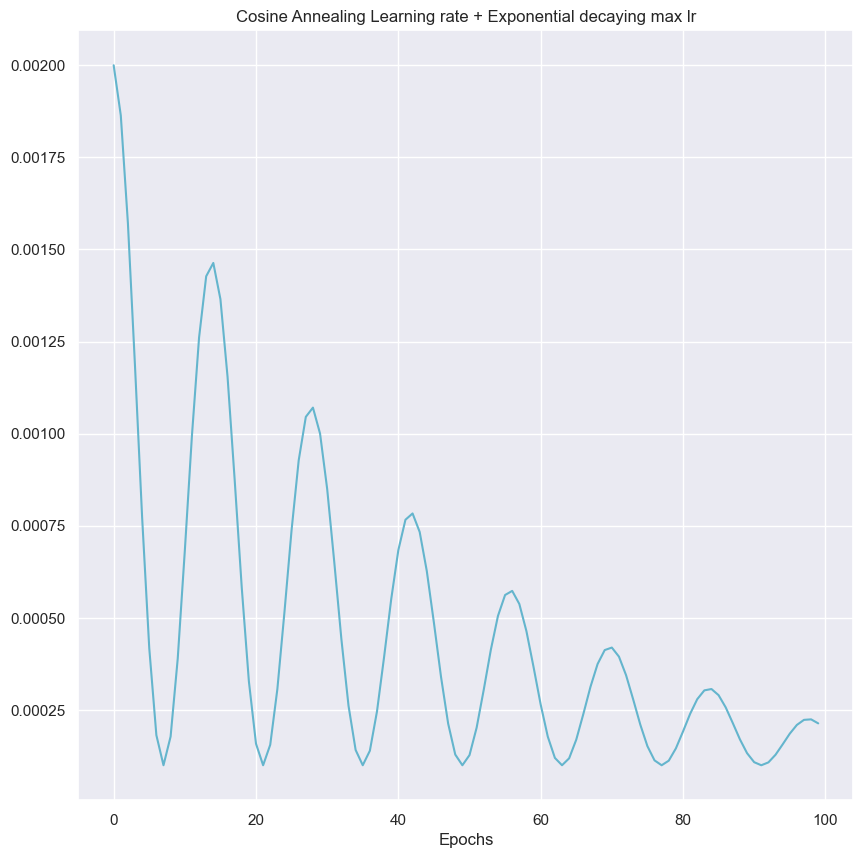

In [64]:
plt.grid('True')
# rcParams['figure.figsize'] = 9,5
T_max=7
eta_max=0.002
eta_min = 0.0001
lr=[]
initial_lrate = eta_max
drop = 0.8
epochs_drop = 10

for epoch in range(100):    
    lr.append(eta_min + (eta_max - eta_min) * (1 + math.cos(math.pi * epoch / T_max)) / 2)
    eta_max = initial_lrate * math.pow(drop, (1+epoch)/epochs_drop)
lr = np.array(lr)
plt.xlabel("Epochs")
plt.title("Cosine Annealing Learning rate + Exponential decaying max lr")
plt.plot(lr, 'c')

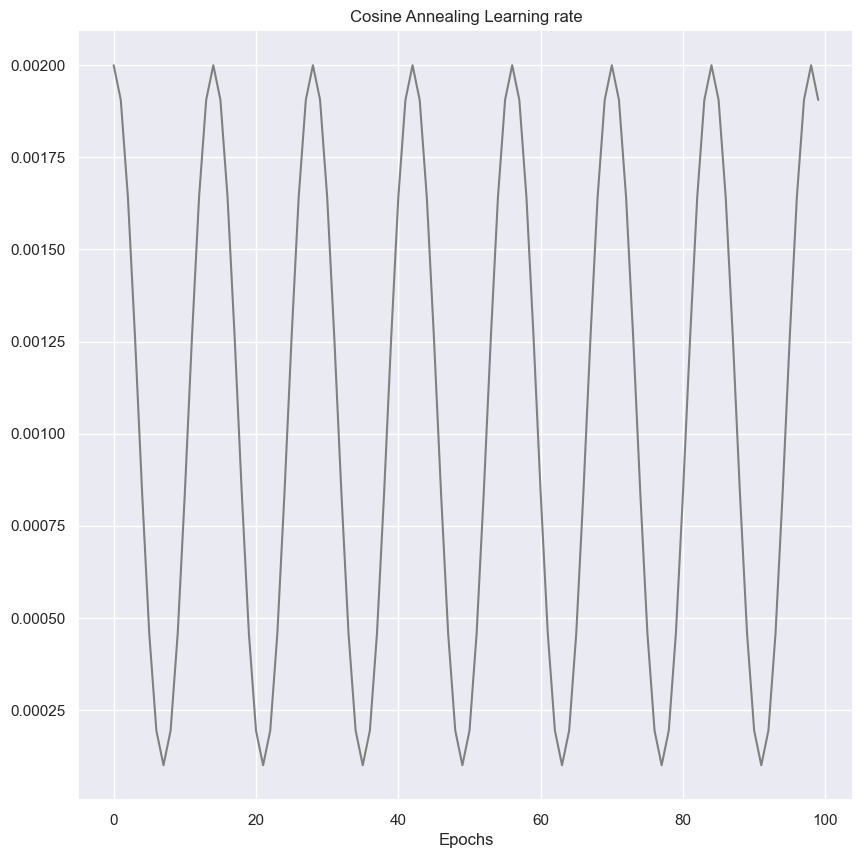

In [65]:
plt.grid('True')
# rcParams['figure.figsize'] = 9,5
T_max=7
eta_max=0.002
eta_min = 0.0001
lr=[]
for epoch in range(100):    
    lr.append(eta_min + (eta_max - eta_min) * (1 + math.cos(math.pi * epoch / T_max)) / 2)
lr = np.array(lr)
plt.xlabel("Epochs")
plt.title("Cosine Annealing Learning rate")
plt.plot(lr, 'grey')
plt.show()

**Model 1 Compile**

In [66]:
batch_size = 16 #reduced from original 32 because of memory issues
epochs = 60 #Reduced from 80 because it took so long for my couputer to compute
#lr_reduce = ReduceLROnPlateau(monitor='val_loss', factor=0.7, patience=7, verbose=1)
filepath_dice_coeff="unet_covid_weights_dice_coeff.hdf5"
filepath_loss = "unet_covid_weights_val_loss.hdf5"
checkpoint_dice = ModelCheckpoint(filepath_dice_coeff, monitor='val_dice_coeff', verbose=1, save_best_only=True, mode='max')
checkpoint_loss = ModelCheckpoint(filepath_loss, monitor='val_loss', verbose=1, save_best_only=True, mode='min')

In [67]:
model.compile(optimizer=Adam(learning_rate = 0.0005), loss=bce_dice_loss, metrics=[dice_coeff])
results = model.fit(x_train, y_train, batch_size=batch_size, epochs=epochs,
                    validation_data=(x_valid, y_valid),
                    callbacks = [checkpoint_dice, checkpoint_loss
                                 , cosine_annealer],
                    use_multiprocessing=True)


Epoch 00001: CosineAnnealingScheduler setting learning rate to 0.0005.
Epoch 1/60
80/80 [==============================] - ETA: 0s - loss: 0.4573 - dice_coeff: 0.3273
Epoch 1: val_dice_coeff improved from -inf to 0.05893, saving model to unet_covid_weights_dice_coeff.hdf5

Epoch 1: val_loss improved from inf to 0.91332, saving model to unet_covid_weights_val_loss.hdf5
80/80 [==============================] - 56s 390ms/step - loss: 0.4573 - dice_coeff: 0.3273 - val_loss: 0.9133 - val_dice_coeff: 0.0589 - lr: 5.0000e-04

Epoch 00002: CosineAnnealingScheduler setting learning rate to 0.0004801937735804838.
Epoch 2/60
80/80 [==============================] - ETA: 0s - loss: 0.2910 - dice_coeff: 0.5750
Epoch 2: val_dice_coeff did not improve from 0.05893

Epoch 2: val_loss improved from 0.91332 to 0.74141, saving model to unet_covid_weights_val_loss.hdf5
80/80 [==============================] - 25s 313ms/step - loss: 0.2910 - dice_coeff: 0.5750 - val_loss: 0.7414 - val_dice_coeff: 0.0102 -

In [72]:
# Clear memory
gc.collect()

46

In [73]:
batch_size = 8 #reduced from original 32 because of memory issues
epochs = 60 #Reduced from 60 because in previous runs improvement stopped around there.
#lr_reduce = ReduceLROnPlateau(monitor='val_loss', factor=0.7, patience=7, verbose=1)
filepath_dice_coeff="unet_covid_weights_dice_coeff_2.hdf5"
filepath_loss = "unet_covid_weights_val_loss_2.hdf5"
checkpoint_dice = ModelCheckpoint(filepath_dice_coeff, monitor='val_dice_coeff', verbose=1, save_best_only=True, mode='max')
checkpoint_loss = ModelCheckpoint(filepath_loss, monitor='val_loss', verbose=1, save_best_only=True, mode='min')

In [74]:
model_2.compile(optimizer=Adam(learning_rate = 0.0005), loss=bce_dice_loss, metrics=[dice_coeff])
results_2 = model_2.fit(x_train, y_train, batch_size=batch_size, epochs=epochs,
                    validation_data=(x_valid, y_valid),
                    callbacks = [checkpoint_dice, checkpoint_loss
                                 , cosine_annealer],
                    use_multiprocessing=True)


Epoch 00001: CosineAnnealingScheduler setting learning rate to 0.0005.
Epoch 1/60
159/159 [==============================] - ETA: 0s - loss: 0.4235 - dice_coeff: 0.3752
Epoch 1: val_dice_coeff improved from -inf to 0.02170, saving model to unet_covid_weights_dice_coeff_2.hdf5

Epoch 1: val_loss improved from inf to 0.67266, saving model to unet_covid_weights_val_loss_2.hdf5
159/159 [==============================] - 678s 4s/step - loss: 0.4235 - dice_coeff: 0.3752 - val_loss: 0.6727 - val_dice_coeff: 0.0217 - lr: 5.0000e-04

Epoch 00002: CosineAnnealingScheduler setting learning rate to 0.0004801937735804838.
Epoch 2/60
159/159 [==============================] - ETA: 0s - loss: 0.2487 - dice_coeff: 0.6364
Epoch 2: val_dice_coeff did not improve from 0.02170

Epoch 2: val_loss did not improve from 0.67266
159/159 [==============================] - 29s 185ms/step - loss: 0.2487 - dice_coeff: 0.6364 - val_loss: 0.7489 - val_dice_coeff: 0.0038 - lr: 4.8019e-04

Epoch 00003: CosineAnnealin

In [75]:
# Clear memory
gc.collect()

1418

In [76]:
batch_size = 16 #reduced from original 32 because of memory issues
epochs = 60 #Reduced from 60 because in previous runs improvement stopped around there.
#lr_reduce = ReduceLROnPlateau(monitor='val_loss', factor=0.7, patience=7, verbose=1)
filepath_dice_coeff="unet_covid_weights_dice_coeff_3.hdf5"
filepath_loss = "unet_covid_weights_val_loss_3.hdf5"
checkpoint_dice = ModelCheckpoint(filepath_dice_coeff, monitor='val_dice_coeff', verbose=1, save_best_only=True, mode='max')
checkpoint_loss = ModelCheckpoint(filepath_loss, monitor='val_loss', verbose=1, save_best_only=True, mode='min')

In [77]:
model_3.compile(optimizer=Adam(learning_rate = 0.0005), loss=bce_dice_loss, metrics=[dice_coeff])
results_3 = model_3.fit(x_train, y_train, batch_size=batch_size, epochs=epochs,
                    validation_data=(x_valid, y_valid),
                    callbacks = [checkpoint_dice, checkpoint_loss
                                 , cosine_annealer],
                    use_multiprocessing=True, workers=8)


Epoch 00001: CosineAnnealingScheduler setting learning rate to 0.0005.
Epoch 1/60
80/80 [==============================] - ETA: 0s - loss: 0.4706 - dice_coeff: 0.2848
Epoch 1: val_dice_coeff improved from -inf to 0.01823, saving model to unet_covid_weights_dice_coeff_3.hdf5

Epoch 1: val_loss improved from inf to 0.64874, saving model to unet_covid_weights_val_loss_3.hdf5
80/80 [==============================] - 30s 290ms/step - loss: 0.4706 - dice_coeff: 0.2848 - val_loss: 0.6487 - val_dice_coeff: 0.0182 - lr: 5.0000e-04

Epoch 00002: CosineAnnealingScheduler setting learning rate to 0.0004801937735804838.
Epoch 2/60
80/80 [==============================] - ETA: 0s - loss: 0.2773 - dice_coeff: 0.5926
Epoch 2: val_dice_coeff did not improve from 0.01823

Epoch 2: val_loss did not improve from 0.64874
80/80 [==============================] - 19s 244ms/step - loss: 0.2773 - dice_coeff: 0.5926 - val_loss: 0.8751 - val_dice_coeff: 1.9977e-04 - lr: 4.8019e-04

Epoch 00003: CosineAnnealingS

In [78]:
# Clear memory
gc.collect()

1414

In [79]:
batch_size = 16 #reduced from original 32 because of memory issues
epochs = 60 #Reduced from 60 because in previous runs improvement stopped around there.
#lr_reduce = ReduceLROnPlateau(monitor='val_loss', factor=0.7, patience=7, verbose=1)
filepath_dice_coeff="unet_covid_weights_dice_coeff_4.hdf5"
filepath_loss = "unet_covid_weights_val_loss_4.hdf5"
checkpoint_dice = ModelCheckpoint(filepath_dice_coeff, monitor='val_dice_coeff', verbose=1, save_best_only=True, mode='max')
checkpoint_loss = ModelCheckpoint(filepath_loss, monitor='val_loss', verbose=1, save_best_only=True, mode='min')

In [80]:
model_4.compile(optimizer=Adam(learning_rate = 0.0005), loss=bce_dice_loss, metrics=[dice_coeff])
results_4 = model_4.fit(x_train, y_train, batch_size=batch_size, epochs=epochs,
                    validation_data=(x_valid, y_valid),
                    callbacks = [checkpoint_dice, checkpoint_loss
                                 , cosine_annealer],
                    use_multiprocessing=True)


Epoch 00001: CosineAnnealingScheduler setting learning rate to 0.0005.
Epoch 1/60
79/80 [============================>.] - ETA: 0s - loss: 0.4650 - dice_coeff: 0.2715
Epoch 1: val_dice_coeff improved from -inf to 0.00615, saving model to unet_covid_weights_dice_coeff_4.hdf5

Epoch 1: val_loss improved from inf to 0.76734, saving model to unet_covid_weights_val_loss_4.hdf5
80/80 [==============================] - 25s 247ms/step - loss: 0.4650 - dice_coeff: 0.2721 - val_loss: 0.7673 - val_dice_coeff: 0.0061 - lr: 5.0000e-04

Epoch 00002: CosineAnnealingScheduler setting learning rate to 0.0004801937735804838.
Epoch 2/60
79/80 [============================>.] - ETA: 0s - loss: 0.3002 - dice_coeff: 0.5526
Epoch 2: val_dice_coeff did not improve from 0.00615

Epoch 2: val_loss did not improve from 0.76734
80/80 [==============================] - 18s 221ms/step - loss: 0.3002 - dice_coeff: 0.5508 - val_loss: 0.9061 - val_dice_coeff: 0.0058 - lr: 4.8019e-04

Epoch 00003: CosineAnnealingSched

In [81]:
gc.collect()

1414

In [82]:
# Clear memory
gc.collect()

23

## Training on Lung data instead of Infection

In [227]:
no_masks = []
for i in range(0, len(lungs_3D)):
    if np.unique(lungs_3D[i]).size == 1:
        no_masks.append(i)
print("Number of complete black masks :" , len(no_masks))
print("They are...",no_masks)

Number of complete black masks : 83
They are... [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410, 411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 1821, 1822, 1823, 1824, 1825, 1826, 1827, 1828, 1829, 1830, 1831, 1832, 1833, 1834, 1835, 1836, 1837, 1838, 1839, 1840, 1841, 1842, 1843, 1844, 1845, 1846, 1847, 1848, 1849, 1850, 1851, 1852, 1853, 1854, 1855, 1856, 1857, 2570, 2571, 2572, 2573, 2574, 2575]


In [228]:
print("There are ",len(no_masks)," images with completely black masks.  I'll need to delete them to have things work.")

There are  83  images with completely black masks.  I'll need to delete them to have things work.


In [229]:
no_masks.reverse()
print(no_masks)

[2575, 2574, 2573, 2572, 2571, 2570, 1857, 1856, 1855, 1854, 1853, 1852, 1851, 1850, 1849, 1848, 1847, 1846, 1845, 1844, 1843, 1842, 1841, 1840, 1839, 1838, 1837, 1836, 1835, 1834, 1833, 1832, 1831, 1830, 1829, 1828, 1827, 1826, 1825, 1824, 1823, 1822, 1821, 420, 419, 418, 417, 416, 415, 414, 413, 412, 411, 410, 409, 408, 407, 406, 405, 404, 403, 402, 401, 19, 18, 17, 16, 15, 14, 13, 12, 11, 10, 9, 8, 7, 6, 5, 4, 3, 2, 1, 0]


In [230]:
cts_3D_L=np.ndarray.tolist(cts_3D)
lungs_3D_L=np.ndarray.tolist(lungs_3D)
infections_3D_L=np.ndarray.tolist(infections_3D)

In [231]:
# removing the images w/o lung masks
for n in no_masks:
    del(cts_3D_L[n])
    del(lungs_3D_L[n])
    del(infections_3D_L[n])

In [232]:
no_masks = []
for i in range(0, len(lungs_3D_L)):
    if np.unique(lungs_3D_L[i]).size == 1:
        no_masks.append(i)
print("Number of complete black masks :" , len(no_masks))

Number of complete black masks : 0


In [233]:
cts_3D_L=np.array(cts_3D_L)
lungs_3D_L=np.array(lungs_3D_L)
infections_3D_L=np.array(infections_3D_L)

C:\ProgramData\Anaconda3\envs\Covid_19_X_Rays\lib\site-packages\ipykernel_launcher.py:1: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  """Entry point for launching an IPython kernel.
C:\ProgramData\Anaconda3\envs\Covid_19_X_Rays\lib\site-packages\ipykernel_launcher.py:2: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.
  
C:\ProgramData\Anaconda3\envs\Covid_19_X_Rays\lib\site-packages\ipykernel_launcher.py:3: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different 

In [234]:
cts_3D_L.shape

(2733,)

In [244]:
# Saving the numpy arrays to later reuse the same preprocessing for other models 
# rather than doing it again and again.
cts_3D_O = np.array(cts_3D, dtype='object')
infections_3D_O = np.array(infections_3D, dtype='object')
lungs_3D_O = np.array(lungs_3D, dtype='object')

In [251]:
print(cts_3D_O.dtype,np.uint8(cts_3D_O[0]).dtype)

object uint8


In [252]:
for n in range(len(cts_3D_O)):
    cts_3D_O[n]=np.uint8(cts_3D_O[n])
    lungs_3D_O[n]=np.uint8(lungs_3D_O[n])
    infections_3D_O[n]=np.uint8(infections_3D_O[n])

In [254]:
# Reshaping the data for training

cts_3D_O = cts_3D.reshape(len(cts_3D_O), new_dim, new_dim, 1)
lungs_3D_O = lungs_3D.reshape(len(lungs_3D_O), new_dim, new_dim, 1)
infections_3D_O = infections_3D.reshape(len(infections_3D_O), new_dim, new_dim, 1)

ValueError: cannot reshape array of size 2816 into shape (2816,224,224,1)

In [255]:
# Reshaping the data for training

cts_3D_O = cts_3D.reshape(len(cts_3D_O), 1)
lungs_3D_O = lungs_3D.reshape(len(lungs_3D_O), 1)
infections_3D_O = infections_3D.reshape(len(infections_3D_O), 1)

In [256]:
# Separating out test vs training data in 

X2=cts_3D # CLAHE enhanced cropped lung data for training
Y2=infections_3D # Infection mask for testing

X2_train, X2_valid, Y2_train, Y2_valid = train_test_split(X2, Y2, test_size=0.3, random_state=42) # random_state used for reproducibility
print(X2_train.shape, X2_valid.shape)
print(Y2_train.shape, Y2_valid.shape)

(1971,) (845,)
(1971,) (845,)


In [217]:
batch_size = 8 #reduced from original 32 because of memory issues
epochs = 60 #Reduced from 60 because in previous runs improvement stopped around there.
#lr_reduce = ReduceLROnPlateau(monitor='val_loss', factor=0.7, patience=7, verbose=1)
filepath_dice_coeff="unet_covid_weights_dice_coeff_lung.hdf5"
filepath_loss = "unet_covid_weights_val_loss_lung.hdf5"
checkpoint_dice = ModelCheckpoint(filepath_dice_coeff, monitor='val_dice_coeff', verbose=1, save_best_only=True, mode='max')
checkpoint_loss = ModelCheckpoint(filepath_loss, monitor='val_loss', verbose=1, save_best_only=True, mode='min')

In [218]:
results = model_4.fit(X2_train, Y2_train, batch_size=batch_size, epochs=epochs,
                    validation_data=(X2_valid, Y2_valid),
                    callbacks = [checkpoint_dice, checkpoint_loss],
                    use_multiprocessing=True)

Epoch 1/60


TypeError: in user code:

    File "C:\ProgramData\Anaconda3\envs\Covid_19_X_Rays\lib\site-packages\keras\engine\training.py", line 1160, in train_function  *
        return step_function(self, iterator)
    File "C:\Users\User\AppData\Local\Temp\ipykernel_32820\669441436.py", line 16, in bce_dice_loss  *
        loss = 0.5*binary_crossentropy(y_true, y_pred) + 0.5*dice_loss(y_true, y_pred)
    File "C:\Users\User\AppData\Local\Temp\ipykernel_32820\669441436.py", line 11, in dice_loss  *
        loss = 1 - dice_coeff(y_true, y_pred)
    File "C:\Users\User\AppData\Local\Temp\ipykernel_32820\669441436.py", line 6, in dice_coeff  *
        intersection = K.sum(y_true_f * y_pred_f)

    TypeError: Input 'y' of 'Mul' Op has type float32 that does not match type uint8 of argument 'x'.


## Saving the model we just created

In [78]:
# Save weights as a .h5 file
model.save_weights('model_weights.h5')
print("Saving weights to disk")

Saving weights to disk


In [79]:
# Saving model as .h5 file
model.save('2D_Model.h5')
print("Saving model to disk")

Saving model to disk


In [81]:
# Save weights as a .h5 file
model_2.save_weights('model2_weights.h5')
print("Saving model 2 weights to disk")

Saving model 2 weights to disk


In [82]:
# Saving model as .h5 file
model_2.save('2D_Model2.h5')
print("Saving model 2 to disk")

Saving model 2 to disk


In [83]:
# Save weights as a .h5 file
model_3.save_weights('model3_weights.h5')
print("Saving model 3 weights to disk")

Saving model 3 weights to disk


In [84]:
# Saving model as .h5 file
model_3.save('2D_Model3.h5')
print("Saving model 3 to disk")

Saving model 3 to disk


In [85]:
# Save weights as a .h5 file
model_4.save_weights('model4_weights.h5')
print("Saving model 4 weights to disk")

Saving model 4 weights to disk


In [86]:
# Saving model as .h5 file
model_4.save('2D_Model4.h5')
print("Saving model 4 to disk")

Saving model 4 to disk


* As a .json file

In [102]:
import json

In [94]:
#Saving as a json file
model_json = model.to_json()
with open("unet_0.8688_cosine_annealer.json","w") as json_file:
     json_file.write(model_json)

In [116]:
config=model.get_config()
with open("unet_0.8688_config.json","w") as json_file:
     json.dump(config, json_file)

## Loading the model we created

In [35]:
# Some preformance metrics which will be our custome ojbects for the model
def dice_coeff(y_true, y_pred):
    smooth = 1.
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    score = (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)
    return score

def dice_loss(y_true, y_pred):
    loss = 1 - dice_coeff(y_true, y_pred)
    return loss


def bce_dice_loss(y_true, y_pred):
    loss = 0.5*binary_crossentropy(y_true, y_pred) + 0.5*dice_loss(y_true, y_pred)
    return loss

def tversky_loss(y_true, y_pred):
    alpha = 0.5
    beta  = 0.5
    
    ones = K.ones(K.shape(y_true))
    p0 = y_pred      # proba that voxels are class i
    p1 = ones-y_pred # proba that voxels are not class i
    g0 = y_true
    g1 = ones-y_true
    
    num = K.sum(p0*g0, (0,1,2))
    den = num + alpha*K.sum(p0*g1,(0,1,2)) + beta*K.sum(p1*g0,(0,1,2))
    
    T = K.sum(num/den) # when summing over classes, T has dynamic range [0 Ncl]
    
    Ncl = K.cast(K.shape(y_true)[-1], 'float32')
    return Ncl-T

def weighted_bce_loss(y_true, y_pred, weight):
    epsilon = 1e-7
    y_pred = K.clip(y_pred, epsilon, 1. - epsilon)
    logit_y_pred = K.log(y_pred / (1. - y_pred))
    loss = weight * (logit_y_pred * (1. - y_true) + 
                     K.log(1. + K.exp(-K.abs(logit_y_pred))) + K.maximum(-logit_y_pred, 0.))
    return K.sum(loss) / K.sum(weight)

def weighted_dice_loss(y_true, y_pred, weight):
    smooth = 1.
    w, m1, m2 = weight, y_true, y_pred
    intersection = (m1 * m2)
    score = (2. * K.sum(w * intersection) + smooth) / (K.sum(w * m1) + K.sum(w * m2) + smooth)
    loss = 1. - K.sum(score)
    return loss

def weighted_bce_dice_loss(y_true, y_pred):
    y_true = K.cast(y_true, 'float32')
    y_pred = K.cast(y_pred, 'float32')
    # if we want to get same size of output, kernel size must be odd
    averaged_mask = K.pool2d(
            y_true, pool_size=(50, 50), strides=(1, 1), padding='same', pool_mode='avg')
    weight = K.ones_like(averaged_mask)
    w0 = K.sum(weight)
    weight = 5. * K.exp(-5. * K.abs(averaged_mask - 0.5))
    w1 = K.sum(weight)
    weight *= (w0 / w1)
    loss = 0.5*weighted_bce_loss(y_true, y_pred, weight) + 0.5*dice_loss(y_true, y_pred)
    return loss

In [36]:
# Dictionary of custom objects needed to load the model
custom_objects={'bce_dice_loss':bce_dice_loss,'dice_coeff':dice_coeff,'dice_loss':dice_loss,'weighted_bce_loss':weighted_bce_loss, 
                'weighted_dice_loss':weighted_dice_loss, 'weighted_bce_dice_loss':weighted_bce_dice_loss}

In [37]:
# Loading the model
model_3=load_model('2D_Model3.h5', custom_objects=custom_objects)

In [112]:
model_3.summary()

Model: "softplus_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_3 (InputLayer)        [(None, 224, 224, 1)]     0         
                                                                 
 conv2d_38 (Conv2D)          (None, 224, 224, 32)      320       
                                                                 
 conv2d_39 (Conv2D)          (None, 224, 224, 32)      9248      
                                                                 
 batch_normalization_16 (Bat  (None, 224, 224, 32)     128       
 chNormalization)                                                
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 112, 112, 32)     0         
 2D)                                                             
                                                                 
 dropout_8 (Dropout)         (None, 112, 112, 32)   

In [38]:
# Loading the model
model_4=load_model('2D_Model4.h5', custom_objects=custom_objects)

In [111]:
model_4.summary()

Model: "relu_model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_4 (InputLayer)        [(None, 224, 224, 1)]     0         
                                                                 
 conv2d_53 (Conv2D)          (None, 224, 224, 32)      320       
                                                                 
 conv2d_54 (Conv2D)          (None, 224, 224, 32)      9248      
                                                                 
 batch_normalization_20 (Bat  (None, 224, 224, 32)     128       
 chNormalization)                                                
                                                                 
 max_pooling2d_12 (MaxPoolin  (None, 112, 112, 32)     0         
 g2D)                                                            
                                                                 
 dropout_12 (Dropout)        (None, 112, 112, 32)      0

## Loading the images we saved

In [76]:
cts=joblib.load('cts_cropped_lungs_224.pkl')
print("loading Raw cts images")
infections=joblib.load('infections_cropped_lungs_224.pkl')
print("loading infection images")
# lungs=joblib.load('cts_cropped_lungs_224.pkl')
# print("loading lung images")

loading Raw cts images
loading infection images


In [40]:
cts=joblib.load('cts_cropped_lungs_3D.pkl')
print("loading Raw cts images")
infections=joblib.load('infections_cropped_lungs_3D.pkl')
print("loading infection images")
lungs=joblib.load('cts_cropped_lungs_3D.pkl')
print("loading lung images")

loading Raw cts images
loading infection images
loading lung images


In [77]:
# Converting to numpy arrays.
cts = np.array(cts)
infections = np.array(infections)

cts = np.uint8(cts)
infections = np.uint8(infections)

In [78]:
type(cts)

numpy.ndarray

In [79]:
cts.shape

(1810, 224, 224)

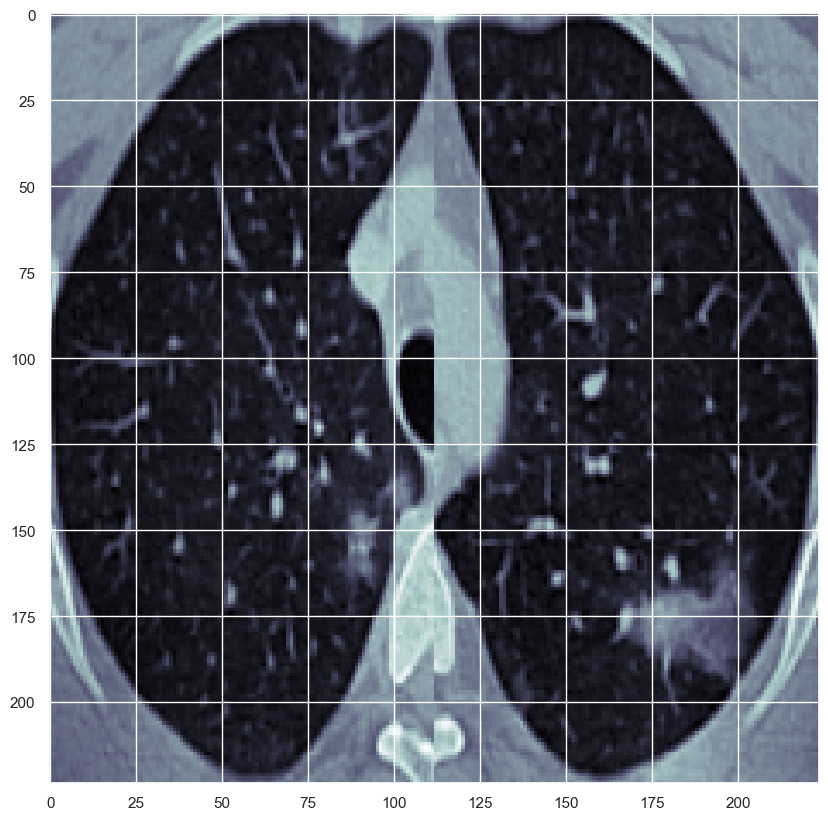

In [80]:
plt.imshow(cts[1000], cmap='bone')

In [81]:
# Separating out test vs training data
from sklearn.model_selection import train_test_split

cts = cts.reshape(len(cts), new_dim, new_dim, 1)
infections = infections.reshape(len(infections), new_dim, new_dim, 1)

x=cts # CLAHE enhanced cropped lung data for training
y=infections # Infection mask for testing

x_train, x_valid, y_train, y_valid = train_test_split(x, y, test_size=0.3, random_state=42) # random_state used for reproducibility
print(x_train.shape, x_valid.shape)
print(y_train.shape, y_valid.shape)

(1267, 224, 224, 1) (543, 224, 224, 1)
(1267, 224, 224, 1) (543, 224, 224, 1)


### Running the loaded models

In [82]:
# Clears memory in case we have an OOM error
gc.collect()

1425

In [93]:
# generate predictions based on model3
x_pred=model_3.predict(x)

57/57 [==============================] - 21s 127ms/step


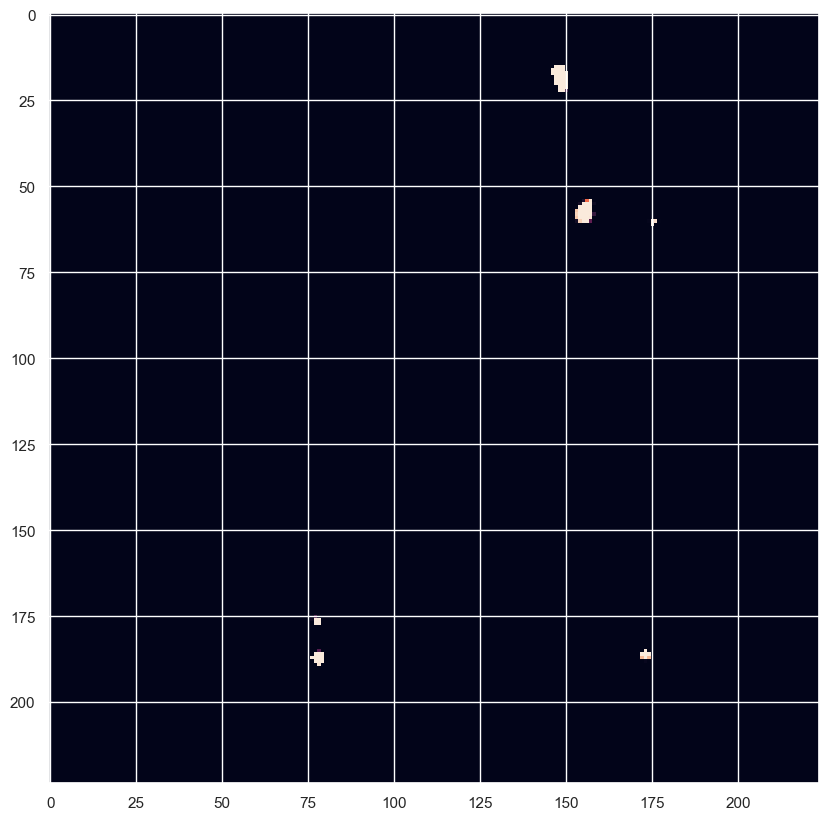

In [97]:
plt.imshow(x_pred[800])

In [113]:
x_pred.shape

(1810, 224, 224, 1)

In [108]:
infections.dtype

dtype('uint8')

In [109]:
score = model_3.evaluate(x, y, batch_size=16, workers=4)
print("test loss, test dice coefficient:", score)

TypeError: in user code:

    File "C:\ProgramData\Anaconda3\envs\Covid_19_X_Rays\lib\site-packages\keras\engine\training.py", line 1727, in test_function  *
        return step_function(self, iterator)
    File "C:\Users\User\AppData\Local\Temp\ipykernel_14236\1970745079.py", line 16, in bce_dice_loss  *
        loss = 0.5*binary_crossentropy(y_true, y_pred) + 0.5*dice_loss(y_true, y_pred)
    File "C:\Users\User\AppData\Local\Temp\ipykernel_14236\1970745079.py", line 11, in dice_loss  *
        loss = 1 - dice_coeff(y_true, y_pred)
    File "C:\Users\User\AppData\Local\Temp\ipykernel_14236\1970745079.py", line 6, in dice_coeff  *
        intersection = K.sum(y_true_f * y_pred_f)

    TypeError: Input 'y' of 'Mul' Op has type float32 that does not match type uint8 of argument 'x'.


## Evaluating our model

In [87]:
score = model.evaluate(x_valid, y_valid, batch_size=16)
print("test loss, test dice coefficient:", score)

34/34 [==============================] - 5s 74ms/step - loss: 0.1043 - dice_coeff: 0.8639
test loss, test dice coefficient: [0.1042562946677208, 0.8639285564422607]


In [88]:
score = model_2.evaluate(x_valid, y_valid, batch_size=16)
print("test loss, test dice coefficient:", score)

34/34 [==============================] - 7s 113ms/step - loss: 0.1107 - dice_coeff: 0.8580
test loss, test dice coefficient: [0.11065709590911865, 0.8579562902450562]


In [89]:
score = model_3.evaluate(x_valid, y_valid, batch_size=16)
print("test loss, test dice coefficient:", score)

34/34 [==============================] - 4s 60ms/step - loss: 0.1181 - dice_coeff: 0.8506
test loss, test dice coefficient: [0.11806651204824448, 0.8505896329879761]


In [90]:
score = model_4.evaluate(x_valid, y_valid, batch_size=16)
print("test loss, test dice coefficient:", score)

34/34 [==============================] - 4s 50ms/step - loss: 0.1182 - dice_coeff: 0.8516
test loss, test dice coefficient: [0.11821402609348297, 0.8515966534614563]


Second two models are not quite as good as the first two, but it is much faster being able to do it in 1/2 the time

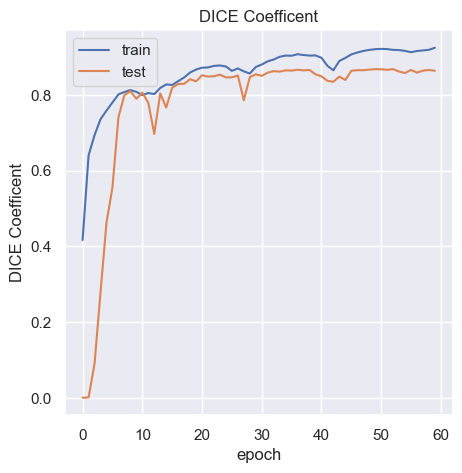

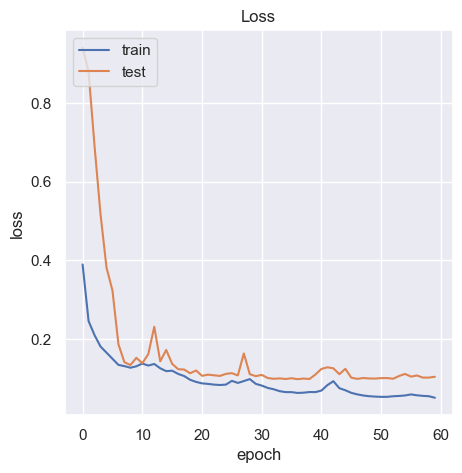

In [91]:
rcParams['figure.figsize'] = 5, 5
plt.plot(results.history['dice_coeff'])
plt.plot(results.history['val_dice_coeff'])
plt.title('DICE Coefficent')
plt.ylabel('DICE Coefficent')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
#plt.ylim(0, 3)
plt.plot(results.history['loss'])
plt.plot(results.history['val_loss'])
plt.title('Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

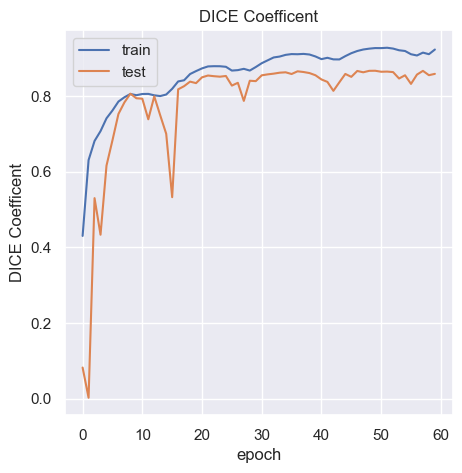

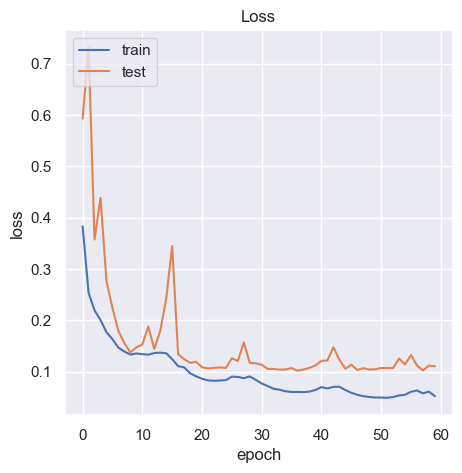

In [92]:
rcParams['figure.figsize'] = 5, 5
plt.plot(results_2.history['dice_coeff'])
plt.plot(results_2.history['val_dice_coeff'])
plt.title('DICE Coefficent')
plt.ylabel('DICE Coefficent')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
#plt.ylim(0, 3)
plt.plot(results_2.history['loss'])
plt.plot(results_2.history['val_loss'])
plt.title('Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

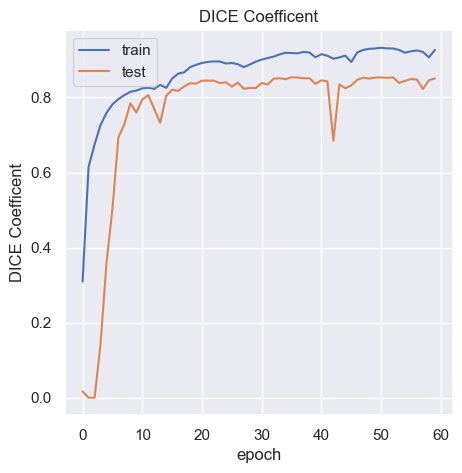

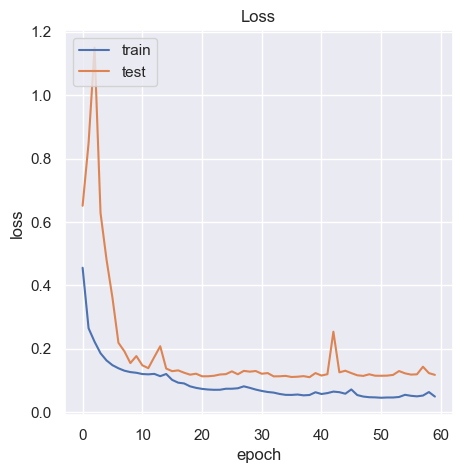

In [93]:
rcParams['figure.figsize'] = 5, 5
plt.plot(results_3.history['dice_coeff'])
plt.plot(results_3.history['val_dice_coeff'])
plt.title('DICE Coefficent')
plt.ylabel('DICE Coefficent')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
#plt.ylim(0, 3)
plt.plot(results_3.history['loss'])
plt.plot(results_3.history['val_loss'])
plt.title('Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

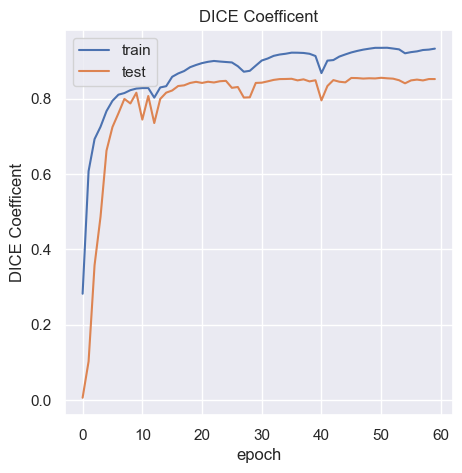

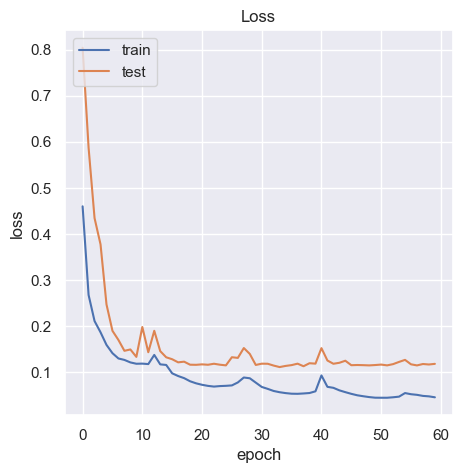

In [94]:
rcParams['figure.figsize'] = 5, 5
plt.plot(results_4.history['dice_coeff'])
plt.plot(results_4.history['val_dice_coeff'])
plt.title('DICE Coefficent')
plt.ylabel('DICE Coefficent')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()
# summarize history for loss
#plt.ylim(0, 3)
plt.plot(results_4.history['loss'])
plt.plot(results_4.history['val_loss'])
plt.title('Loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'test'], loc='upper left')
plt.show()

In [95]:
plt.rcParams["axes.grid"] = False

In [96]:
def compare_actual_and_predicted(image_no):
    temp = model.predict(cts[image_no].reshape(1,new_dim, new_dim, 1))

    fig = plt.figure(figsize=(15,15))

    plt.subplot(1,3,1)
    plt.imshow(cts[image_no].reshape(new_dim, new_dim), cmap='bone')
    plt.title('Original Image (CT)')

    plt.subplot(1,3,2)
    plt.imshow(infections[image_no].reshape(new_dim,new_dim), cmap='bone')
    plt.title('Actual mask')

    plt.subplot(1,3,3)
    plt.imshow(temp.reshape(new_dim,new_dim), cmap='bone')
    plt.title('Predicted mask')

    plt.show()
    
# plt.imshow(temp.reshape(img_size, img_size), cmap = 'bone')
# plt.imshow(infections_scaled[120].reshape(img_size, img_size), cmap ='summer')

1/1 [==============================] - 4s 4s/step


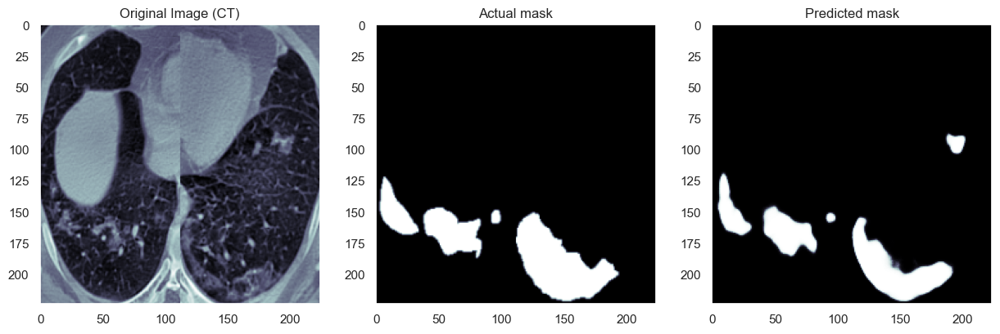

1/1 [==============================] - 2s 2s/step


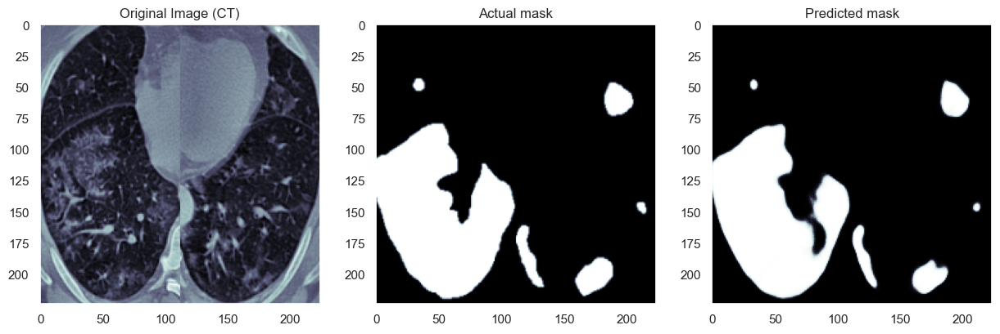

1/1 [==============================] - 1s 792ms/step


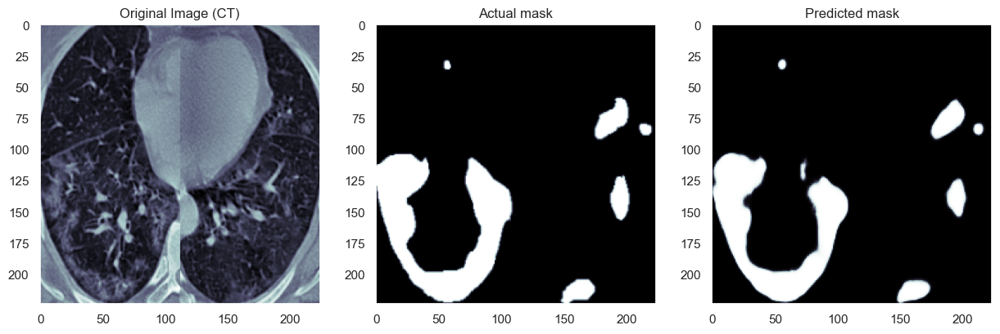

1/1 [==============================] - 1s 786ms/step


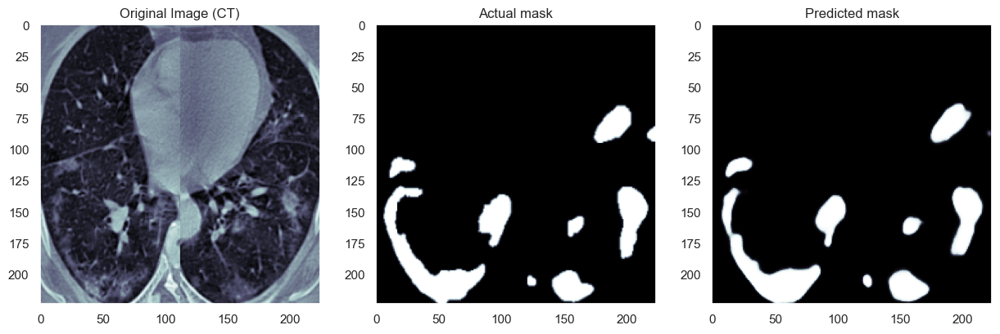

1/1 [==============================] - 1s 778ms/step


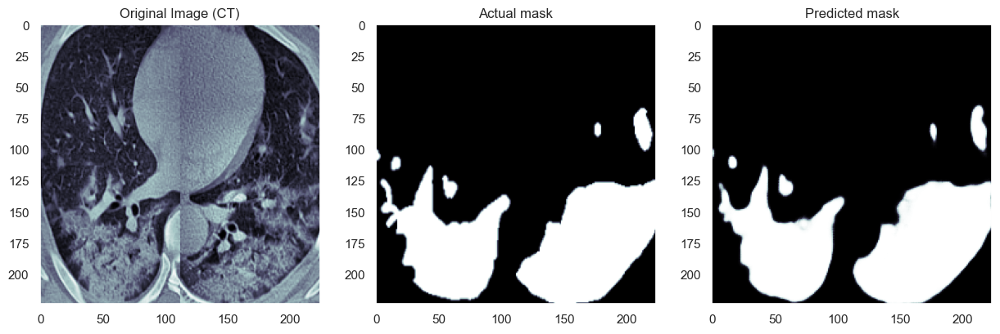

1/1 [==============================] - 1s 783ms/step


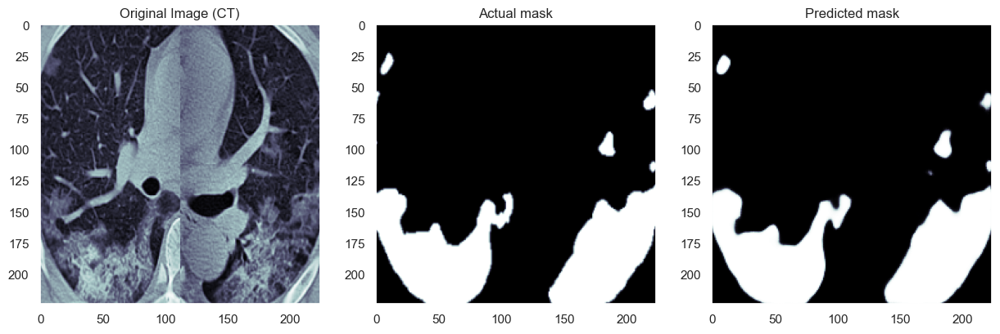

1/1 [==============================] - 1s 784ms/step


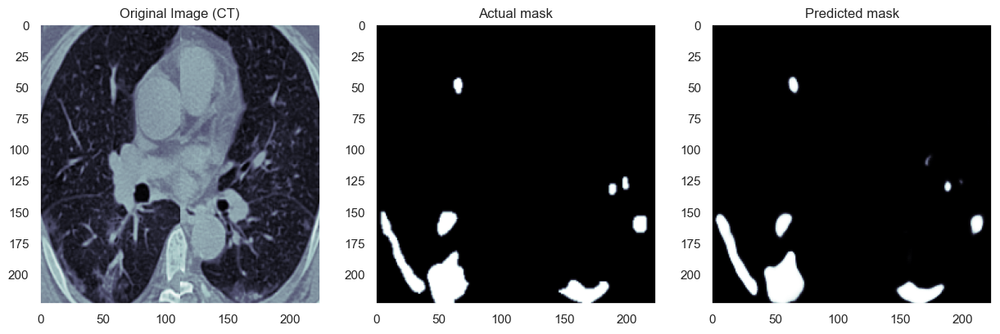

In [97]:
for i in [30, 40, 50, 55, 355, 380, 90]:
    compare_actual_and_predicted(i)

In [98]:
# Clear memory
gc.collect()

26060

In [99]:
def compare_actual_and_predicted_2(image_no):
    temp = model_2.predict(cts[image_no].reshape(1,new_dim, new_dim, 1))

    fig = plt.figure(figsize=(15,15))

    plt.subplot(1,3,1)
    plt.imshow(cts[image_no].reshape(new_dim, new_dim), cmap='bone')
    plt.title('Original Image (CT)')

    plt.subplot(1,3,2)
    plt.imshow(infections[image_no].reshape(new_dim,new_dim), cmap='bone')
    plt.title('Actual mask')

    plt.subplot(1,3,3)
    plt.imshow(temp.reshape(new_dim,new_dim), cmap='bone')
    plt.title('Predicted mask')

    plt.show()
    
# plt.imshow(temp.reshape(img_size, img_size), cmap = 'bone')
# plt.imshow(infections_scaled[120].reshape(img_size, img_size), cmap ='summer')

1/1 [==============================] - 4s 4s/step


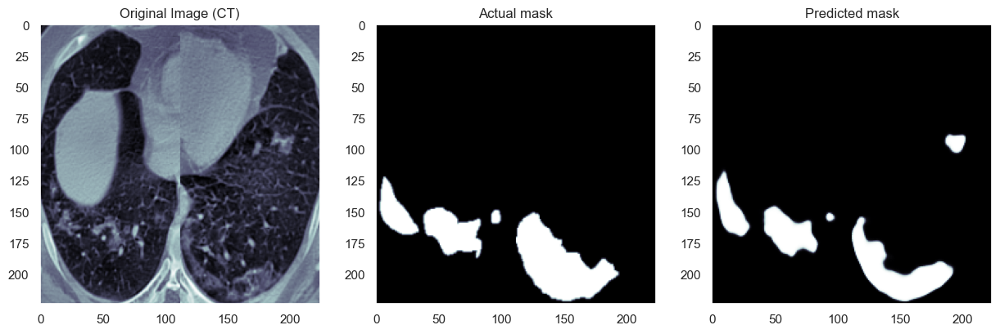

1/1 [==============================] - 2s 2s/step


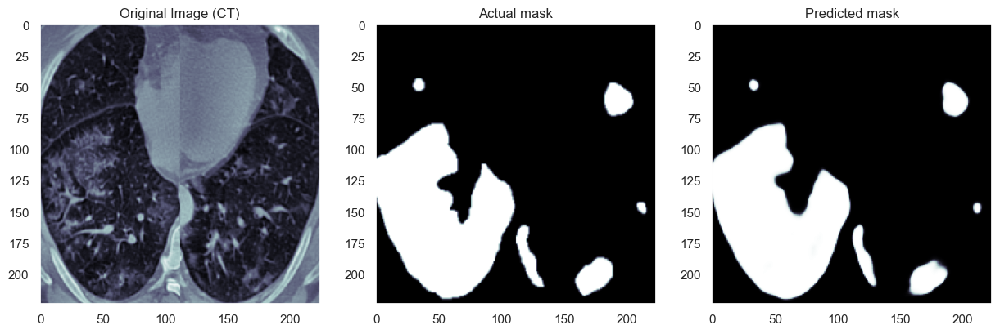

1/1 [==============================] - 1s 861ms/step


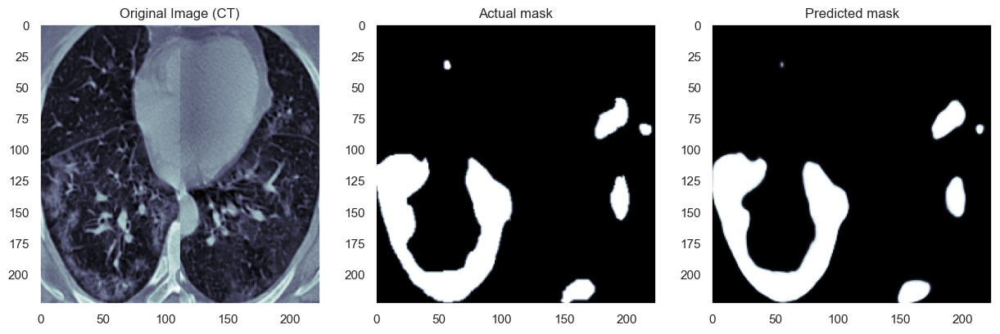

1/1 [==============================] - 1s 793ms/step


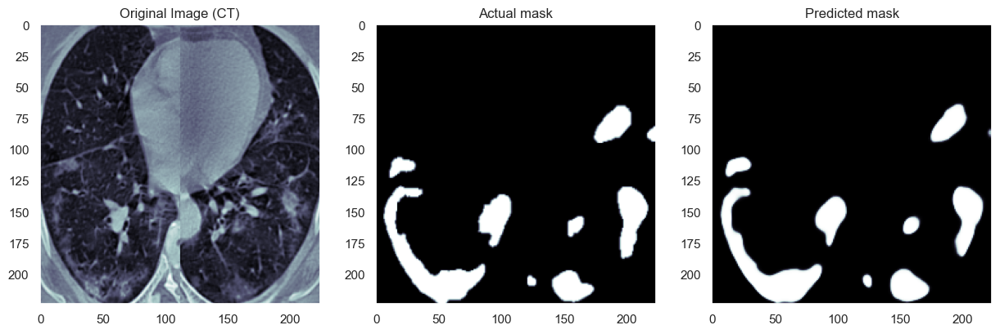

1/1 [==============================] - 1s 808ms/step


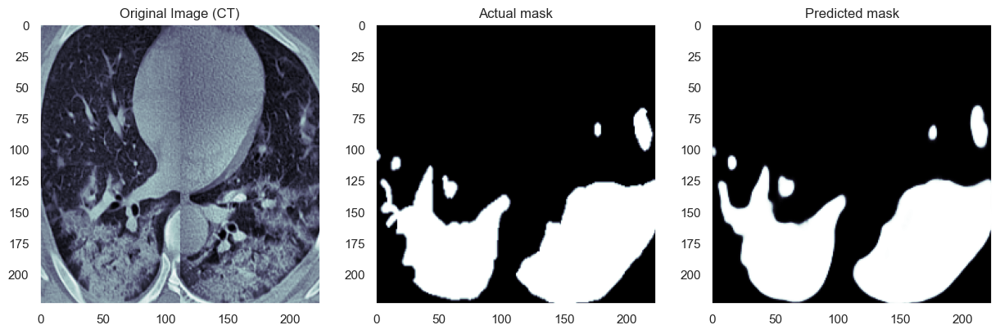

1/1 [==============================] - 1s 788ms/step


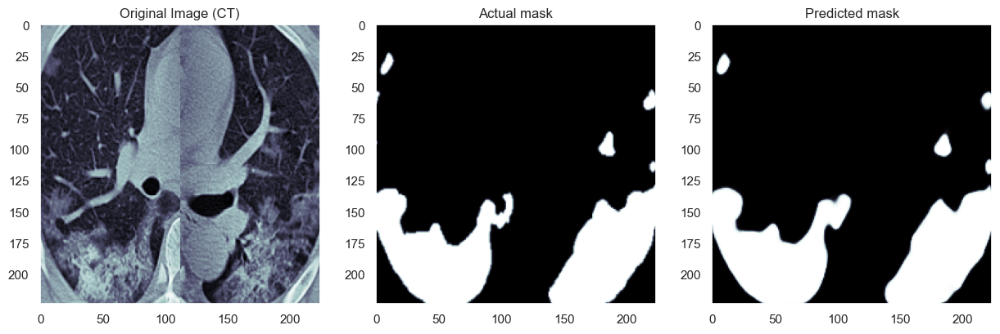

1/1 [==============================] - 1s 798ms/step


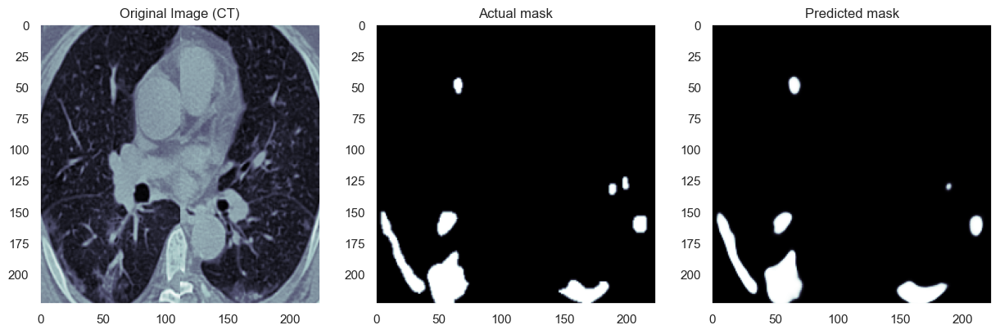

In [100]:
for i in [30, 40, 50, 55, 355, 380, 90]:
    compare_actual_and_predicted_2(i)

In [101]:
# Clear memory
gc.collect()

60766

In [102]:
def compare_actual_and_predicted_3(image_no):
    temp = model_3.predict(cts[image_no].reshape(1,new_dim, new_dim, 1))

    fig = plt.figure(figsize=(15,15))

    plt.subplot(1,3,1)
    plt.imshow(cts[image_no].reshape(new_dim, new_dim), cmap='bone')
    plt.title('Original Image (CT)')

    plt.subplot(1,3,2)
    plt.imshow(infections[image_no].reshape(new_dim,new_dim), cmap='bone')
    plt.title('Actual mask')

    plt.subplot(1,3,3)
    plt.imshow(temp.reshape(new_dim,new_dim), cmap='bone')
    plt.title('Predicted mask')

    plt.show()
    
# plt.imshow(temp.reshape(img_size, img_size), cmap = 'bone')
# plt.imshow(infections_scaled[120].reshape(img_size, img_size), cmap ='summer')

1/1 [==============================] - 3s 3s/step


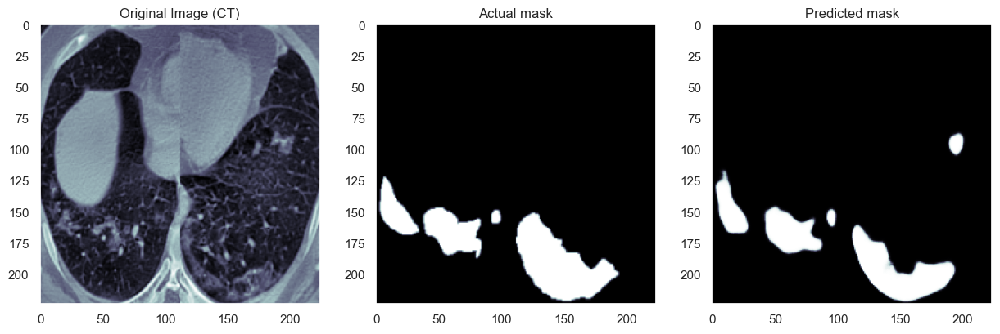

1/1 [==============================] - 2s 2s/step


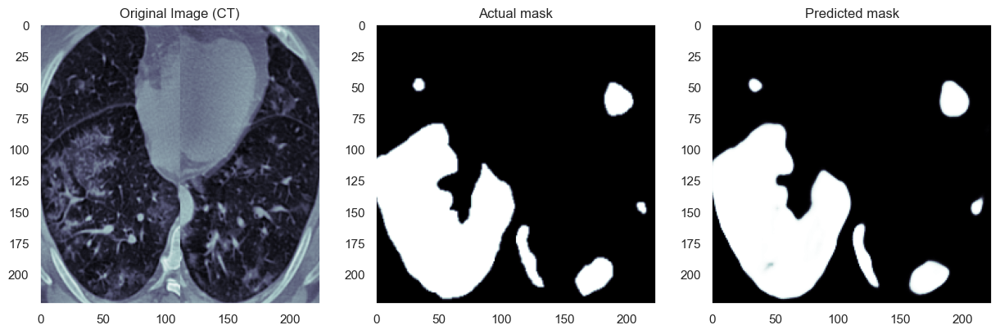

1/1 [==============================] - 1s 790ms/step


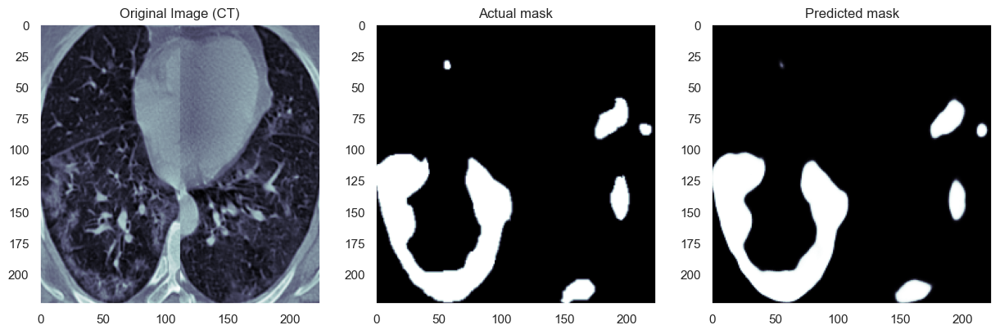

1/1 [==============================] - 1s 787ms/step


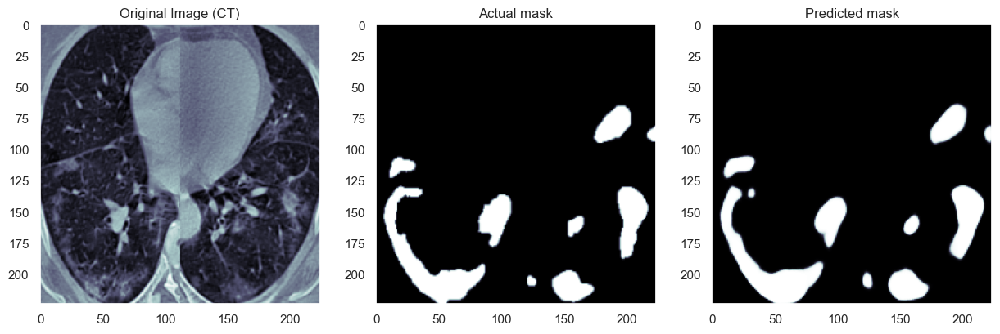

1/1 [==============================] - 1s 787ms/step


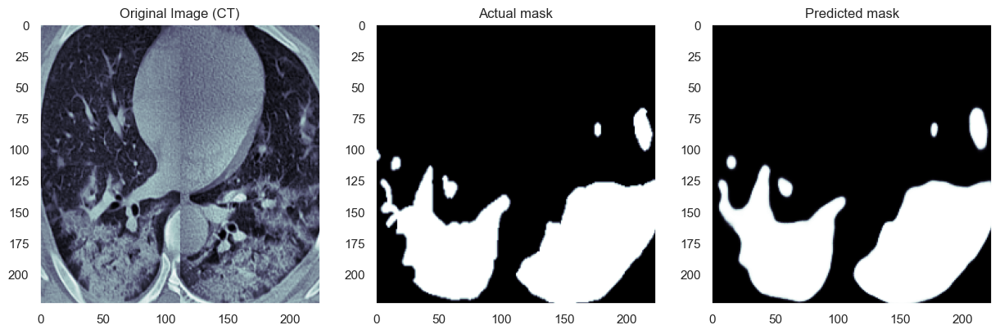

1/1 [==============================] - 1s 794ms/step


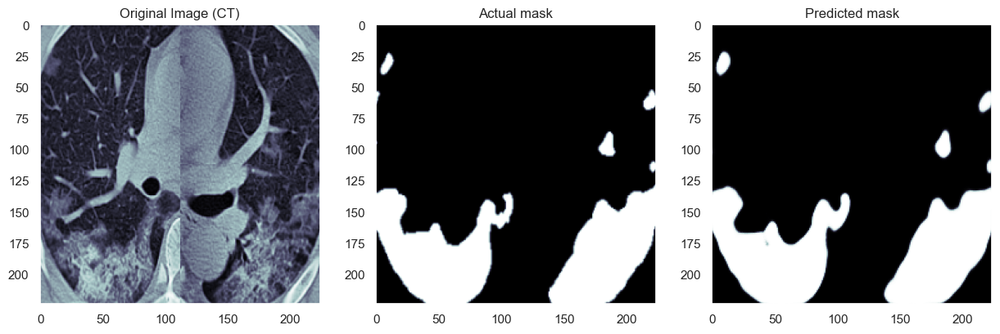

1/1 [==============================] - 1s 798ms/step


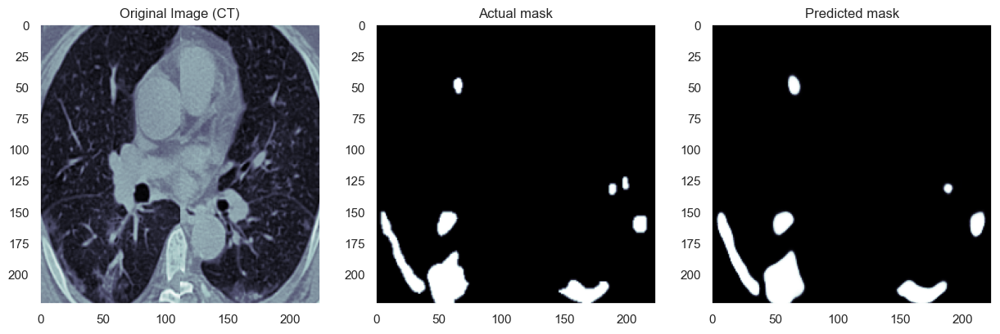

In [103]:
for i in [30, 40, 50, 55, 355, 380, 90]:
    compare_actual_and_predicted_3(i)

In [104]:
gc.collect()

60761

In [105]:
def compare_actual_and_predicted_4(image_no):
    temp = model_4.predict(cts[image_no].reshape(1,new_dim, new_dim, 1))

    fig = plt.figure(figsize=(15,15))

    plt.subplot(1,3,1)
    plt.imshow(cts[image_no].reshape(new_dim, new_dim), cmap='bone')
    plt.title('Original Image (CT)')

    plt.subplot(1,3,2)
    plt.imshow(infections[image_no].reshape(new_dim,new_dim), cmap='bone')
    plt.title('Actual mask')

    plt.subplot(1,3,3)
    plt.imshow(temp.reshape(new_dim,new_dim), cmap='bone')
    plt.title('Predicted mask')

    plt.show()
    
# plt.imshow(temp.reshape(img_size, img_size), cmap = 'bone')
# plt.imshow(infections_scaled[120].reshape(img_size, img_size), cmap ='summer')

1/1 [==============================] - 1s 772ms/step


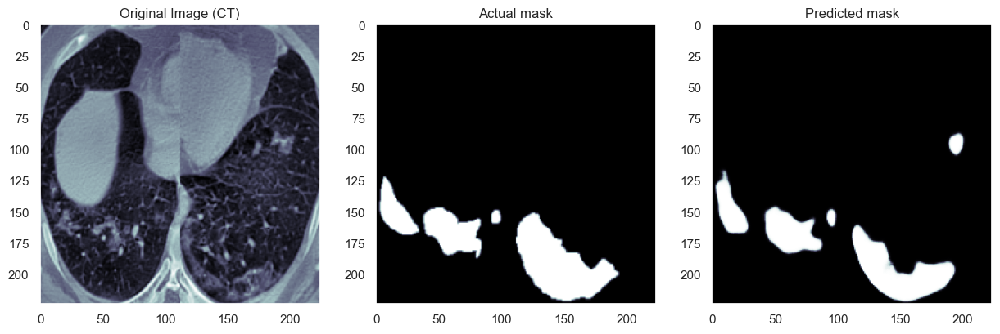

1/1 [==============================] - 1s 780ms/step


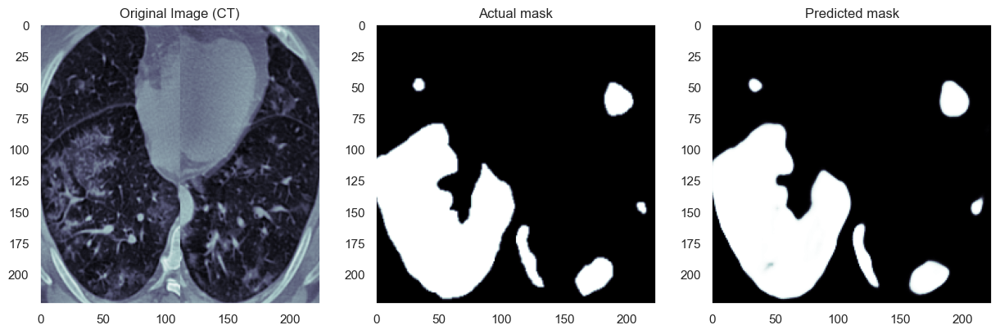

1/1 [==============================] - 1s 790ms/step


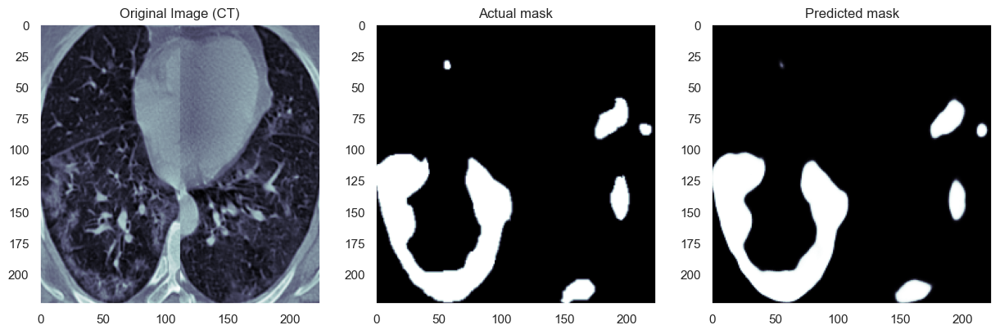

1/1 [==============================] - 1s 779ms/step


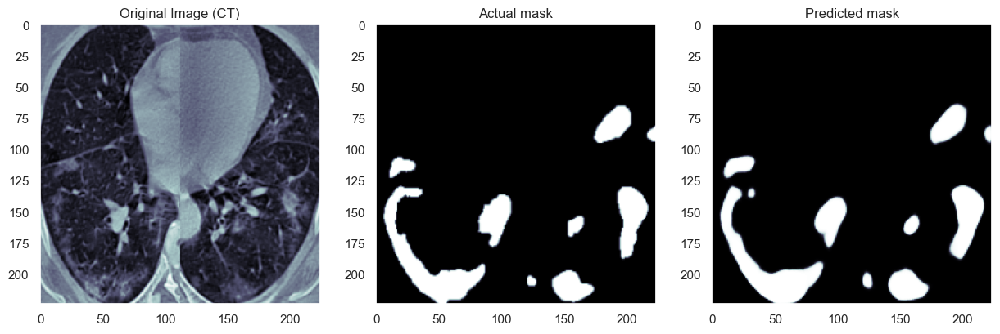

1/1 [==============================] - 1s 780ms/step


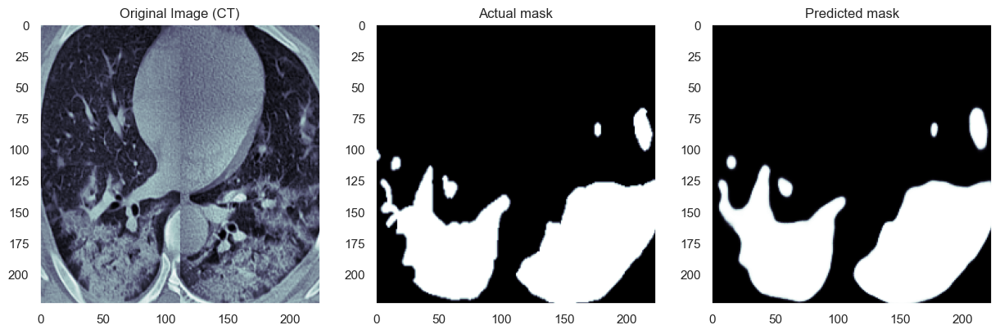

1/1 [==============================] - 1s 781ms/step


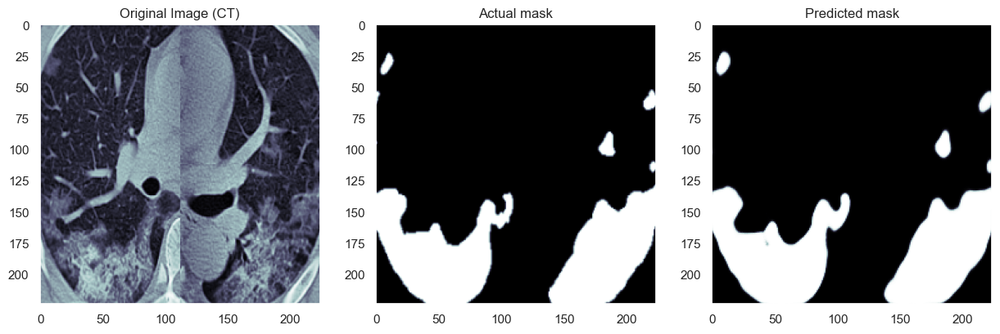

1/1 [==============================] - 1s 790ms/step


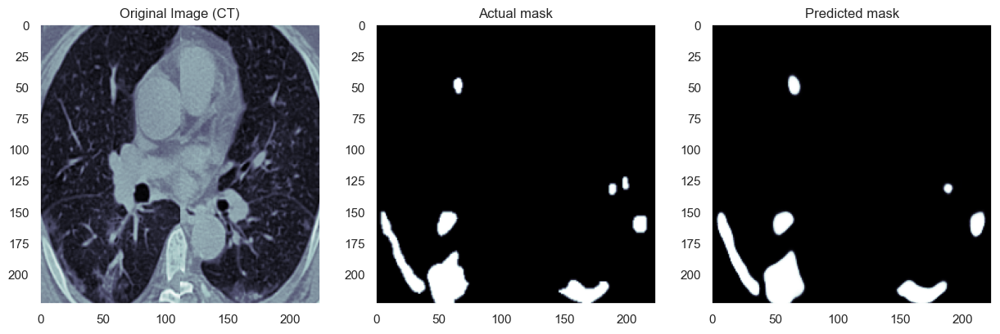

In [106]:
for i in [30, 40, 50, 55, 355, 380, 90]:
    compare_actual_and_predicted_3(i)

In [107]:
gc.collect()

60766

* Lets save a couple of these as figures for later

1/1 [==============================] - 1s 764ms/step


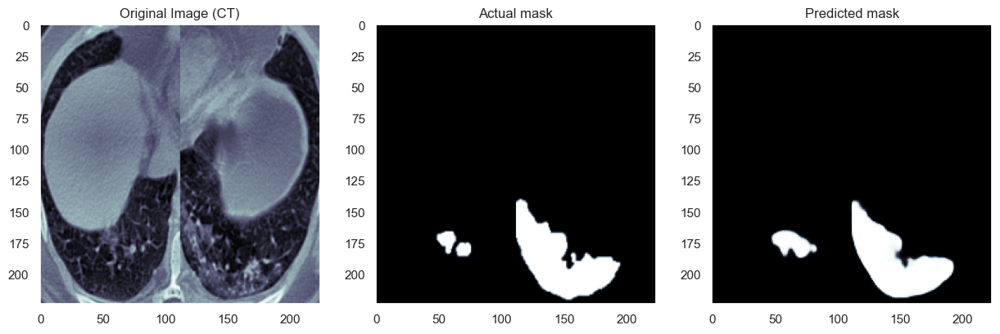

In [108]:
image_no=20
temp = model.predict(cts[image_no].reshape(1,new_dim, new_dim, 1))

fig = plt.figure(figsize=(15,15))

plt.subplot(1,3,1)
plt.imshow(cts[image_no].reshape(new_dim, new_dim), cmap='bone')
plt.title('Original Image (CT)')

plt.subplot(1,3,2)
plt.imshow(infections[image_no].reshape(new_dim,new_dim), cmap='bone')
plt.title('Actual mask')

plt.subplot(1,3,3)
plt.imshow(temp.reshape(new_dim,new_dim), cmap='bone')
plt.title('Predicted mask')

plt.show()
fig.savefig('./output/prediction_image_1.png')

1/1 [==============================] - 1s 769ms/step


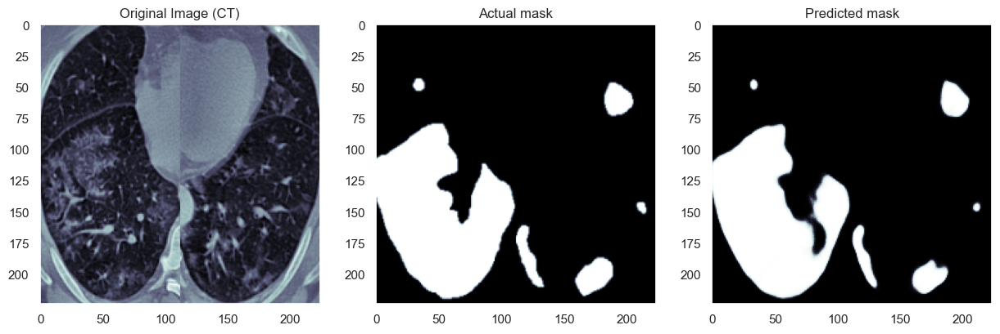

In [109]:
image_no=40
temp = model.predict(cts[image_no].reshape(1,new_dim, new_dim, 1))

fig = plt.figure(figsize=(15,15))

plt.subplot(1,3,1)
plt.imshow(cts[image_no].reshape(new_dim, new_dim), cmap='bone')
plt.title('Original Image (CT)')

plt.subplot(1,3,2)
plt.imshow(infections[image_no].reshape(new_dim,new_dim), cmap='bone')
plt.title('Actual mask')

plt.subplot(1,3,3)
plt.imshow(temp.reshape(new_dim,new_dim), cmap='bone')
plt.title('Predicted mask')

plt.show()
fig.savefig('./output/prediction_image_2.png')

1/1 [==============================] - 1s 779ms/step


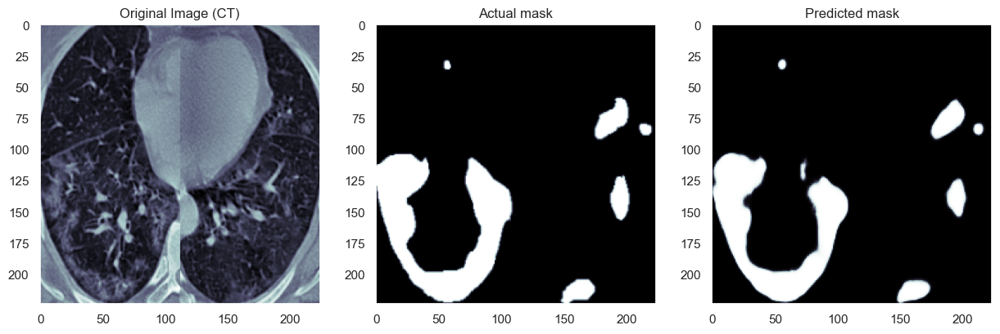

In [110]:
image_no=50
temp = model.predict(cts[image_no].reshape(1,new_dim, new_dim, 1))

fig = plt.figure(figsize=(15,15))

plt.subplot(1,3,1)
plt.imshow(cts[image_no].reshape(new_dim, new_dim), cmap='bone')
plt.title('Original Image (CT)')

plt.subplot(1,3,2)
plt.imshow(infections[image_no].reshape(new_dim,new_dim), cmap='bone')
plt.title('Actual mask')

plt.subplot(1,3,3)
plt.imshow(temp.reshape(new_dim,new_dim), cmap='bone')
plt.title('Predicted mask')

plt.show()
fig.savefig('./output/prediction_image_3.png')

Model 1 Results

In [111]:
dices=[]
ious=[]
the_range = np.arange(0.10,0.80, 0.05)

for t in the_range:
    iou = sm.metrics.IOUScore(threshold=t)
    dice = sm.metrics.FScore(threshold=t)
    model.compile(optimizer=Adam(learning_rate = 0.0005), loss=bce_dice_loss, metrics=[dice, iou])
    score = model.evaluate(x_valid, y_valid, batch_size=16)
    dices.append(score[1])
    ious.append(score[2])

34/34 [==============================] - 6s 76ms/step - loss: 0.1043 - f1-score: 0.8636 - iou_score: 0.7605


In [112]:
print('DICES:',dices)
print("IOUS:",ious)
print("Best Threshold:", the_range[np.argmax(dices)])
print("Best dice score:", dices[np.argmax(dices)])
print("Best iou score:", ious[np.argmax(ious)])

DICES: [0.8725823163986206, 0.87261563539505, 0.87233567237854, 0.8719294667243958, 0.8714101910591125, 0.8709006309509277, 0.8703480958938599, 0.8697171807289124, 0.868985652923584, 0.8682392835617065, 0.8673642873764038, 0.8663299083709717, 0.8651205897331238, 0.8635774850845337]
IOUS: [0.7743992209434509, 0.7744697332382202, 0.7740408182144165, 0.773411750793457, 0.7726036906242371, 0.7718082070350647, 0.7709494829177856, 0.7699643969535828, 0.7688286900520325, 0.7676671743392944, 0.7663090229034424, 0.764706015586853, 0.7628388404846191, 0.7604572176933289]
Best Threshold: 0.15000000000000002
Best dice score: 0.87261563539505
Best iou score: 0.7744697332382202


Best Threshold: 0.15000000000000002


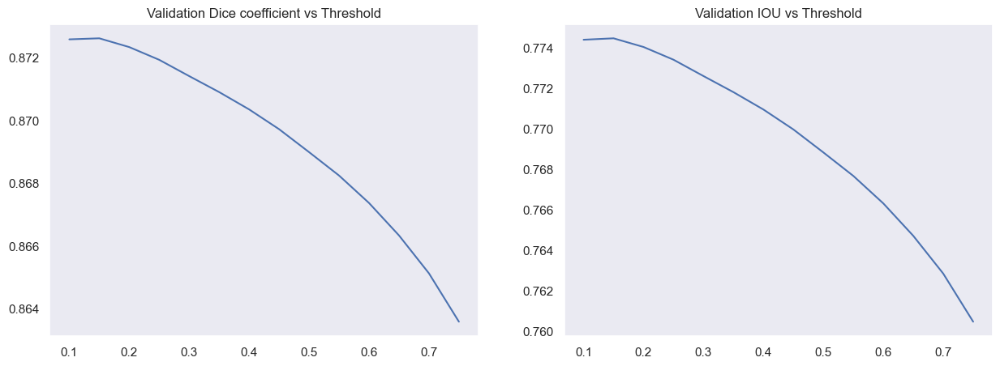

In [113]:
print("Best Threshold:", the_range[np.argmax(dices)])
fig = plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
plt.plot(the_range, dices)
plt.title("Validation Dice coefficient vs Threshold")

plt.subplot(1, 2, 2)
plt.plot(the_range, ious)
plt.title("Validation IOU vs Threshold")

plt.show()

In [114]:
gc.collect()

12023

**Model 2 Results**

In [115]:
dices=[]
ious=[]
the_range = np.arange(0.10,0.80, 0.075)

for t in the_range:
    iou = sm.metrics.IOUScore(threshold=t)
    dice = sm.metrics.FScore(threshold=t)
    model_2.compile(optimizer=Adam(learning_rate = 0.0005), loss=bce_dice_loss, metrics=[dice, iou])
    score = model_2.evaluate(x_valid, y_valid, batch_size=16)
    dices.append(score[1])
    ious.append(score[2])

34/34 [==============================] - 7s 87ms/step - loss: 0.1107 - f1-score: 0.8568 - iou_score: 0.7504


In [116]:
print('DICES:',dices)
print("IOUS:",ious)
print("Best Threshold:", the_range[np.argmax(dices)])
print("Best dice score:", dices[np.argmax(dices)])
print("Best iou score:", ious[np.argmax(ious)])

DICES: [0.865397036075592, 0.8653343319892883, 0.8648359179496765, 0.8641377687454224, 0.8633077144622803, 0.8624700307846069, 0.8614273071289062, 0.8602399826049805, 0.8587623834609985, 0.8567813038825989]
IOUS: [0.7634350061416626, 0.763384222984314, 0.762640118598938, 0.7615775465965271, 0.7603129148483276, 0.7590328454971313, 0.7574387192726135, 0.7556250095367432, 0.753369927406311, 0.75035560131073]
Best Threshold: 0.1
Best dice score: 0.865397036075592
Best iou score: 0.7634350061416626


Best Threshold: 0.1


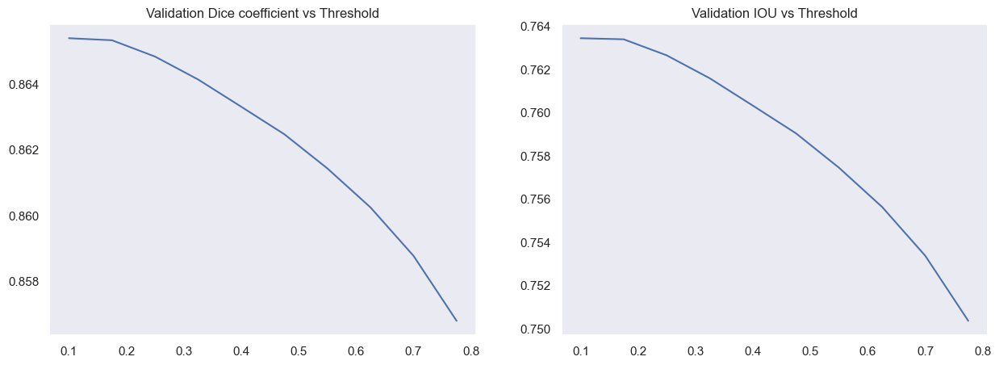

In [117]:
print("Best Threshold:", the_range[np.argmax(dices)])
fig = plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
plt.plot(the_range, dices)
plt.title("Validation Dice coefficient vs Threshold")

plt.subplot(1, 2, 2)
plt.plot(the_range, ious)
plt.title("Validation IOU vs Threshold")

plt.show()

In [118]:
gc.collect()

14648

### Model 3 Results

In [119]:
dices=[]
ious=[]
the_range = np.arange(0.05,0.80, 0.075)

for t in the_range:
    iou = sm.metrics.IOUScore(threshold=t)
    dice = sm.metrics.FScore(threshold=t)
    model_3.compile(optimizer=Adam(learning_rate = 0.0005), loss=bce_dice_loss, metrics=[dice, iou])
    score = model_3.evaluate(x_valid, y_valid, batch_size=16)
    dices.append(score[1])
    ious.append(score[2])

34/34 [==============================] - 6s 60ms/step - loss: 0.1181 - f1-score: 0.8530 - iou_score: 0.7446


In [120]:
print('DICES:',dices)
print("IOUS:",ious)
print("Best Threshold:", the_range[np.argmax(dices)])
print("Best dice score:", dices[np.argmax(dices)])
print("Best iou score:", ious[np.argmax(ious)])

DICES: [0.8498750329017639, 0.8540897965431213, 0.8550604581832886, 0.8553956747055054, 0.8554263710975647, 0.8552724123001099, 0.8549818992614746, 0.8545967936515808, 0.8539471626281738, 0.8530009984970093]
IOUS: [0.7396122217178345, 0.7460763454437256, 0.7475926876068115, 0.7481290698051453, 0.748197078704834, 0.7479837536811829, 0.7475597262382507, 0.7469871044158936, 0.7460123300552368, 0.7445937991142273]
Best Threshold: 0.35
Best dice score: 0.8554263710975647
Best iou score: 0.748197078704834


Best Threshold: 0.35


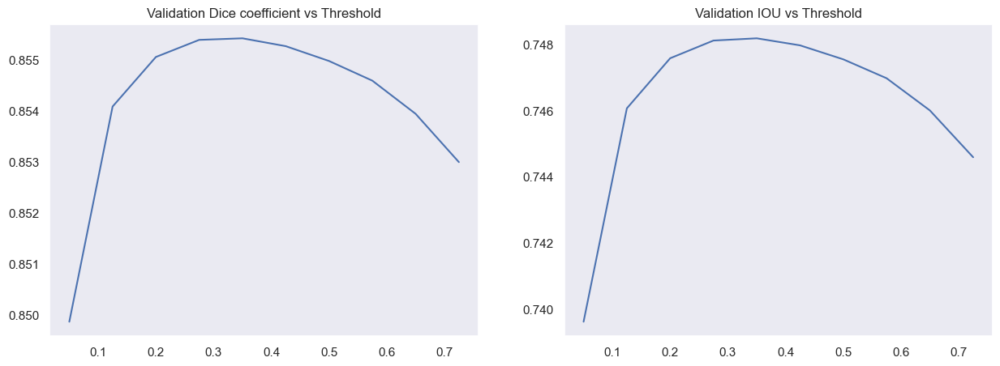

In [121]:
print("Best Threshold:", the_range[np.argmax(dices)])
fig = plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
plt.plot(the_range, dices)
plt.title("Validation Dice coefficient vs Threshold")

plt.subplot(1, 2, 2)
plt.plot(the_range, ious)
plt.title("Validation IOU vs Threshold")

plt.show()

In [122]:
gc.collect()

14718

Not bad and 20% faster than Deadskull7's

### Model 4 Results

In [124]:
dices=[]
ious=[]
the_range = np.arange(0.05,0.80, 0.075)

for t in the_range:
    iou = sm.metrics.IOUScore(threshold=t)
    dice = sm.metrics.FScore(threshold=t)
    model_4.compile(optimizer=Adam(learning_rate = 0.0005), loss=bce_dice_loss, metrics=[dice, iou])
    score = model_4.evaluate(x_valid, y_valid, batch_size=16)
    dices.append(score[1])
    ious.append(score[2])

34/34 [==============================] - 5s 51ms/step - loss: 0.1182 - f1-score: 0.8527 - iou_score: 0.7439


In [125]:
print('DICES:',dices)
print("IOUS:",ious)
print("Best Threshold:", the_range[np.argmax(dices)])
print("Best dice score:", dices[np.argmax(dices)])
print("Best iou score:", ious[np.argmax(ious)])

DICES: [0.855091392993927, 0.8573446273803711, 0.8573780655860901, 0.8570228219032288, 0.8565753102302551, 0.85601806640625, 0.8554492592811584, 0.8547152876853943, 0.8538375496864319, 0.8526747822761536]
IOUS: [0.7474355101585388, 0.7509159445762634, 0.750983715057373, 0.7504521608352661, 0.7497788071632385, 0.7489377856254578, 0.748076856136322, 0.746971607208252, 0.7456477880477905, 0.7438948750495911]
Best Threshold: 0.2
Best dice score: 0.8573780655860901
Best iou score: 0.750983715057373


Best Threshold: 0.2


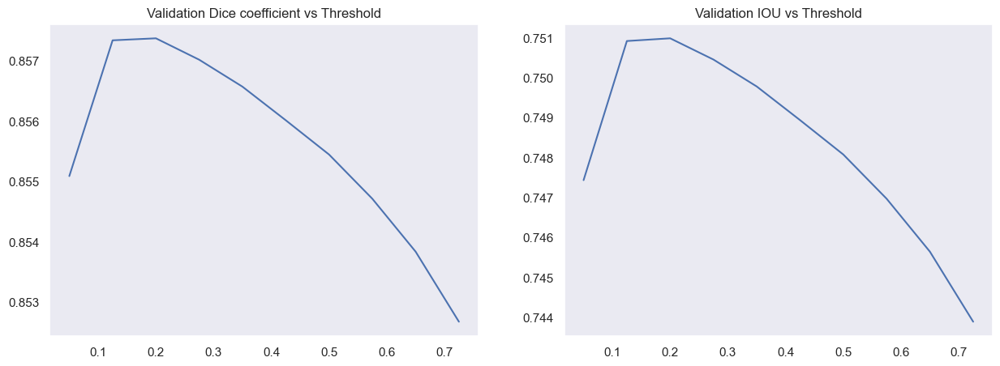

In [126]:
print("Best Threshold:", the_range[np.argmax(dices)])
fig = plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
plt.plot(the_range, dices)
plt.title("Validation Dice coefficient vs Threshold")

plt.subplot(1, 2, 2)
plt.plot(the_range, ious)
plt.title("Validation IOU vs Threshold")

plt.show()

In [127]:
gc.collect()

16300

### By narrowing the range we compute the metrics we can see more granular details

In [133]:
the_new_range = np.arange(0.10,0.30, 0.02)
new_dices=[]
new_ious=[]

for t in the_new_range:
    iou = sm.metrics.IOUScore(threshold=t)
    dice = sm.metrics.FScore(threshold=t)
    model.compile(optimizer=Adam(learning_rate = 0.0005), loss=bce_dice_loss, metrics=[dice, iou])
    score = model.evaluate(x_valid, y_valid, batch_size=16)
    new_dices.append(score[1])
    new_ious.append(score[2])

34/34 [==============================] - 6s 75ms/step - loss: 0.1043 - f1-score: 0.8716 - iou_score: 0.7730


In [134]:
print("We just checked for",len(the_new_range), "steps between 0.10 and 0.30")

We just checked for 10 steps between 0.10 and 0.30


In [135]:
print('NEW DICES:',new_dices)
print("NEW IOUS:",new_ious)
print("New Best Threshold:", the_new_range[np.argmax(new_dices)])
print("Best new dice score:", new_dices[np.argmax(new_dices)])
print("Best new iou score:", new_ious[np.argmax(new_ious)])

NEW DICES: [0.8725823163986206, 0.8727124333381653, 0.8726742267608643, 0.8725585341453552, 0.872469961643219, 0.87233567237854, 0.8722001314163208, 0.8720211386680603, 0.8718534111976624, 0.8716359734535217]
NEW IOUS: [0.7743992209434509, 0.7746108174324036, 0.7745580077171326, 0.7743804454803467, 0.7742462754249573, 0.7740408182144165, 0.7738322019577026, 0.773553192615509, 0.7732944488525391, 0.7729568481445312]
New Best Threshold: 0.12000000000000001
Best new dice score: 0.8727124333381653
Best new iou score: 0.7746108174324036


Best Threshold: 0.12000000000000001


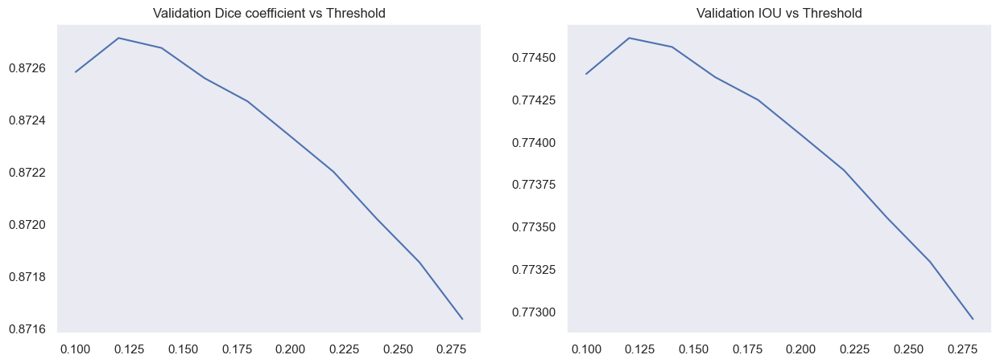

In [136]:
print("Best Threshold:", the_new_range[np.argmax(new_dices)])
fig = plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
plt.plot(the_new_range, new_dices)
plt.title("Validation Dice coefficient vs Threshold")

plt.subplot(1, 2, 2)
plt.plot(the_new_range, new_ious)
plt.title("Validation IOU vs Threshold")

plt.show()
fig.savefig('./output/DICE_vs_IOU.png')

In [137]:
gc.collect()

14772

In [138]:
dices=[]
ious=[]
the_range = np.arange(0.10,0.30, 0.02)

for t in the_range:
    iou = sm.metrics.IOUScore(threshold=t)
    dice = sm.metrics.FScore(threshold=t)
    model_4.compile(optimizer=Adam(learning_rate = 0.0005), loss=bce_dice_loss, metrics=[dice, iou])
    score = model_4.evaluate(x_valid, y_valid, batch_size=16)
    dices.append(score[1])
    ious.append(score[2])

34/34 [==============================] - 5s 50ms/step - loss: 0.1182 - f1-score: 0.8570 - iou_score: 0.7504


In [139]:
print('DICES:',dices)
print("IOUS:",ious)
print("Best Threshold:", the_range[np.argmax(dices)])
print("Best dice score:", dices[np.argmax(dices)])
print("Best iou score:", ious[np.argmax(ious)])

DICES: [0.8571058511734009, 0.8572991490364075, 0.857398509979248, 0.8574270009994507, 0.8574392199516296, 0.8573780655860901, 0.857314944267273, 0.857200026512146, 0.8570981621742249, 0.857008159160614]
IOUS: [0.7505403757095337, 0.7508439421653748, 0.7510029673576355, 0.7510499954223633, 0.7510749697685242, 0.750983715057373, 0.7508900761604309, 0.7507169842720032, 0.7505653500556946, 0.750430703163147]
Best Threshold: 0.18000000000000002
Best dice score: 0.8574392199516296
Best iou score: 0.7510749697685242


Best Threshold: 0.18000000000000002


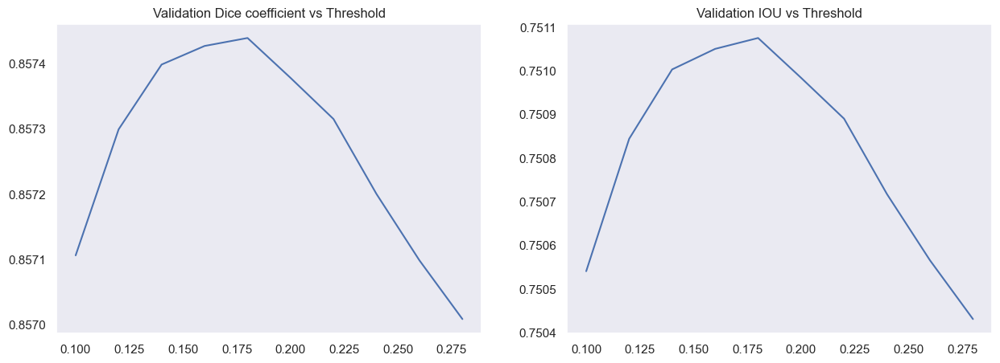

In [140]:
print("Best Threshold:", the_range[np.argmax(dices)])
fig = plt.figure(figsize=(15,5))

plt.subplot(1, 2, 1)
plt.plot(the_range, dices)
plt.title("Validation Dice coefficient vs Threshold")

plt.subplot(1, 2, 2)
plt.plot(the_range, ious)
plt.title("Validation IOU vs Threshold")

plt.show()

In [141]:
gc.collect()

14875

### Measuring precision and recall of the models

In [142]:
the_prec_rec_range = np.arange(0,1, 0.1)
precisions=[]
recalls=[]

for t in the_prec_rec_range:
    precision = sm.metrics.Precision(threshold=t)
    recall = sm.metrics.Recall(threshold=t)
    model.compile(optimizer=Adam(lr = 0.0005), loss=bce_dice_loss, metrics=[precision, recall])
    score = model.evaluate(x_valid, y_valid, batch_size=16)
    precisions.append(score[1])
    recalls.append(score[2])

C:\ProgramData\Anaconda3\envs\Covid_19_X_Rays\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


34/34 [==============================] - 6s 76ms/step - loss: 0.1043 - precision: 0.9300 - recall: 0.7901


In [143]:
print('PRECISIONS:',precisions)
print("RRECALLS:",recalls)
print("Best Threshold for Precision:", the_prec_rec_range[np.argmax(precisions)])
print("Best Threshold for Recall:", the_prec_rec_range[np.argmax(recalls)])
print("Best precision score:", precisions[np.argmax(precisions)])
print("Best recall score:", recalls[np.argmax(recalls)])

PRECISIONS: [0.06656894832849503, 0.8673132658004761, 0.8819338083267212, 0.8898906111717224, 0.8959710597991943, 0.9013180136680603, 0.9065159559249878, 0.9121913909912109, 0.9191190004348755, 0.9299623966217041]
RRECALLS: [1.0, 0.8784402012825012, 0.863471508026123, 0.8542174100875854, 0.8466923236846924, 0.8394427299499512, 0.8320163488388062, 0.823245108127594, 0.8113229274749756, 0.7900699377059937]
Best Threshold for Precision: 0.9
Best Threshold for Recall: 0.0
Best precision score: 0.9299623966217041
Best recall score: 1.0


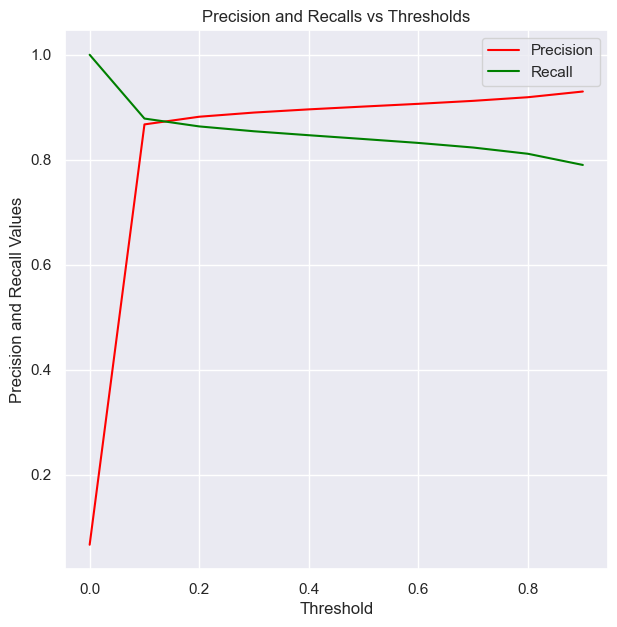

In [144]:
fig = plt.figure(figsize=(7,7))
plt.rcParams["axes.grid"] = True
plt.title("Precision and Recalls vs Thresholds")
plt.xlabel('Threshold')
plt.ylabel('Precision and Recall Values')
plt.plot(the_prec_rec_range,precisions, color='red')
plt.plot(the_prec_rec_range, recalls, color='green')
plt.legend(['Precision', 'Recall'])
plt.show()
fig.savefig('./output/percision_and_recall.png')

In [145]:
print("Precision and Recall cross at ", (0.8697679042816162 + 0.877758264541626)/2)

Precision and Recall cross at  0.8737630844116211


In [146]:
gc.collect()

14818

In [147]:
the_prec_rec_range = np.arange(0,1, 0.1)
precisions=[]
recalls=[]

for t in the_prec_rec_range:
    precision = sm.metrics.Precision(threshold=t)
    recall = sm.metrics.Recall(threshold=t)
    model_2.compile(optimizer=Adam(lr = 0.0005), loss=bce_dice_loss, metrics=[precision, recall])
    score = model_2.evaluate(x_valid, y_valid, batch_size=16)
    precisions.append(score[1])
    recalls.append(score[2])

34/34 [==============================] - 7s 87ms/step - loss: 0.1107 - precision: 0.9241 - recall: 0.7876


In [148]:
print('PRECISIONS:',precisions)
print("RRECALLS:",recalls)
print("Best Threshold for Precision:", the_prec_rec_range[np.argmax(precisions)])
print("Best Threshold for Recall:", the_prec_rec_range[np.argmax(recalls)])
print("Best precision score:", precisions[np.argmax(precisions)])
print("Best recall score:", recalls[np.argmax(recalls)])

PRECISIONS: [0.06656894832849503, 0.8632508516311646, 0.8777430653572083, 0.8857461214065552, 0.8915988206863403, 0.8968110680580139, 0.9017248749732971, 0.9071069955825806, 0.9137983918190002, 0.9241095781326294]
RRECALLS: [1.0, 0.868658721446991, 0.854034960269928, 0.8451347947120667, 0.8378982543945312, 0.8312296867370605, 0.8242805600166321, 0.8164886832237244, 0.8060616850852966, 0.787584662437439]
Best Threshold for Precision: 0.9
Best Threshold for Recall: 0.0
Best precision score: 0.9241095781326294
Best recall score: 1.0


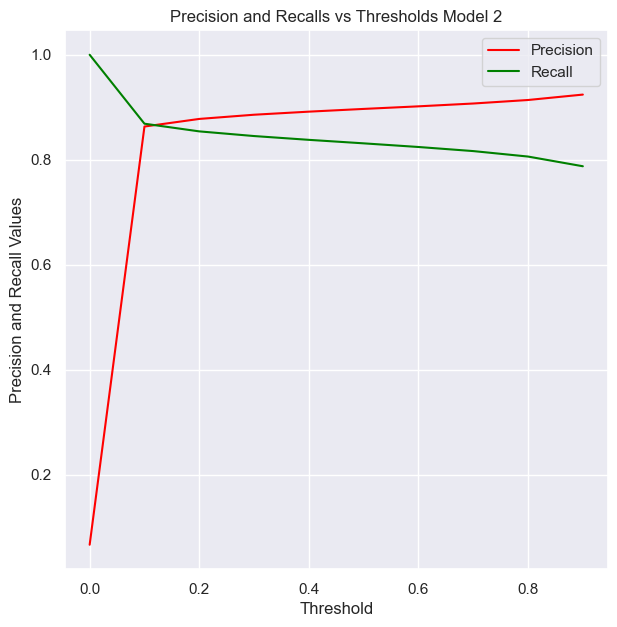

In [149]:
fig = plt.figure(figsize=(7,7))
plt.rcParams["axes.grid"] = True
plt.title("Precision and Recalls vs Thresholds Model 2")
plt.xlabel('Threshold')
plt.ylabel('Precision and Recall Values')
plt.plot(the_prec_rec_range,precisions, color='red')
plt.plot(the_prec_rec_range, recalls, color='green')
plt.legend(['Precision', 'Recall'])
plt.show()
fig.savefig('./output/percision_and_recall_2.png')

In [150]:
gc.collect()

12045

In [151]:
the_prec_rec_range = np.arange(0,1, 0.1)
precisions=[]
recalls=[]

for t in the_prec_rec_range:
    precision = sm.metrics.Precision(threshold=t)
    recall = sm.metrics.Recall(threshold=t)
    model_3.compile(optimizer=Adam(lr = 0.0005), loss=bce_dice_loss, metrics=[precision, recall])
    score = model_3.evaluate(x_valid, y_valid, batch_size=16)
    precisions.append(score[1])
    recalls.append(score[2])

34/34 [==============================] - 5s 59ms/step - loss: 0.1181 - precision: 0.8978 - recall: 0.8029


In [152]:
print('PRECISIONS:',precisions)
print("RRECALLS:",recalls)
print("Best Threshold for Precision:", the_prec_rec_range[np.argmax(precisions)])
print("Best Threshold for Recall:", the_prec_rec_range[np.argmax(recalls)])
print("Best precision score:", precisions[np.argmax(precisions)])
print("Best recall score:", recalls[np.argmax(recalls)])

PRECISIONS: [0.0665692389011383, 0.8286328315734863, 0.8436668515205383, 0.8524324893951416, 0.8591543436050415, 0.8651567697525024, 0.8710508346557617, 0.8773552179336548, 0.885252058506012, 0.8978159427642822]
RRECALLS: [1.0, 0.8806973695755005, 0.8678716421127319, 0.8595818877220154, 0.8527251482009888, 0.8461907505989075, 0.8396124839782715, 0.831800639629364, 0.8213686943054199, 0.8029410243034363]
Best Threshold for Precision: 0.9
Best Threshold for Recall: 0.0
Best precision score: 0.8978159427642822
Best recall score: 1.0


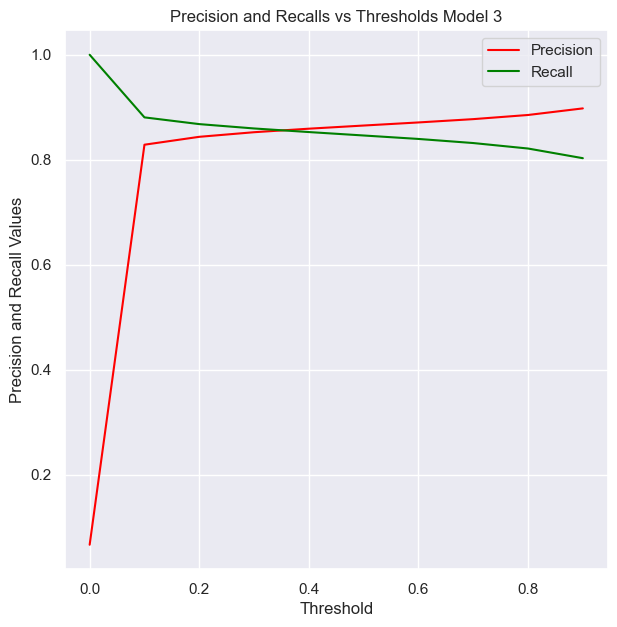

In [153]:
fig = plt.figure(figsize=(7,7))
plt.rcParams["axes.grid"] = True
plt.title("Precision and Recalls vs Thresholds Model 3")
plt.xlabel('Threshold')
plt.ylabel('Precision and Recall Values')
plt.plot(the_prec_rec_range,precisions, color='red')
plt.plot(the_prec_rec_range, recalls, color='green')
plt.legend(['Precision', 'Recall'])
plt.show()
fig.savefig('./output/percision_and_recall_3.png')

In [154]:
gc.collect()

12033

In [155]:
the_prec_rec_range = np.arange(0,1, 0.1)
precisions=[]
recalls=[]

for t in the_prec_rec_range:
    precision = sm.metrics.Precision(threshold=t)
    recall = sm.metrics.Recall(threshold=t)
    model_4.compile(optimizer=Adam(lr = 0.0005), loss=bce_dice_loss, metrics=[precision, recall])
    score = model_4.evaluate(x_valid, y_valid, batch_size=16)
    precisions.append(score[1])
    recalls.append(score[2])

34/34 [==============================] - 5s 50ms/step - loss: 0.1182 - precision: 0.9031 - recall: 0.7964


In [156]:
print('PRECISIONS:',precisions)
print("RRECALLS:",recalls)
print("Best Threshold for Precision:", the_prec_rec_range[np.argmax(precisions)])
print("Best Threshold for Recall:", the_prec_rec_range[np.argmax(recalls)])
print("Best precision score:", precisions[np.argmax(precisions)])
print("Best recall score:", recalls[np.argmax(recalls)])

PRECISIONS: [0.06656894832849503, 0.8457702398300171, 0.8590003252029419, 0.8659722805023193, 0.871244490146637, 0.8760308623313904, 0.8807551264762878, 0.8859261274337769, 0.8923612833023071, 0.903120756149292]
RRECALLS: [1.0, 0.8694851994514465, 0.8564792275428772, 0.848717451095581, 0.8423800468444824, 0.8365320563316345, 0.8303305506706238, 0.8233349323272705, 0.8140438795089722, 0.7964415550231934]
Best Threshold for Precision: 0.9
Best Threshold for Recall: 0.0
Best precision score: 0.903120756149292
Best recall score: 1.0


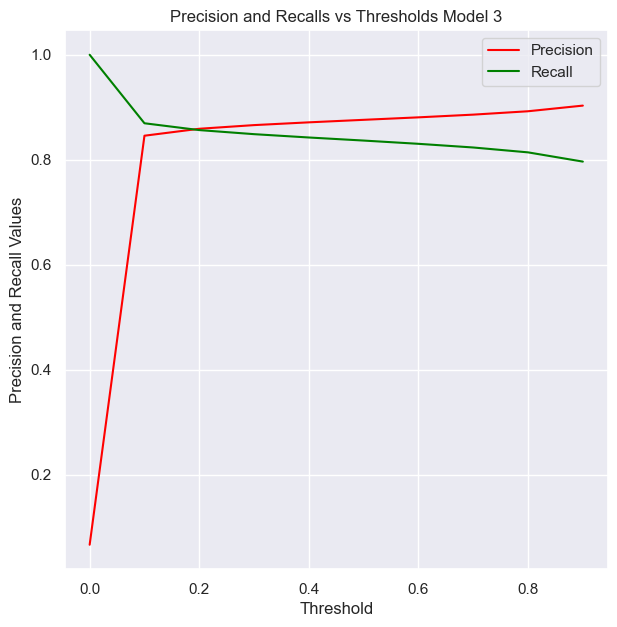

In [157]:
fig = plt.figure(figsize=(7,7))
plt.rcParams["axes.grid"] = True
plt.title("Precision and Recalls vs Thresholds Model 3")
plt.xlabel('Threshold')
plt.ylabel('Precision and Recall Values')
plt.plot(the_prec_rec_range,precisions, color='red')
plt.plot(the_prec_rec_range, recalls, color='green')
plt.legend(['Precision', 'Recall'])
plt.show()
fig.savefig('./output/percision_and_recall_4.png')

In [158]:
gc.collect()

12031

## 3D CNN

In [131]:
gc.collect()

2272

In [132]:
model_3D = models.Sequential()
model_3D.add(layers.Conv3D(32, (3, 3, 3), activation='relu', input_shape=(224, 224, 224, 1)))
model_3D.add(layers.MaxPooling3D((2, 2, 2)))
model_3D.add(layers.Dropout(0.25))
model_3D.add(layers.Conv3D(64, (3, 3, 3), activation='relu'))
model_3D.add(layers.MaxPooling3D((2, 2, 2)))
model_3D.add(layers.Dropout(0.25))
model_3D.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_5 (Conv3D)           (None, 222, 222, 222, 32  896       
                             )                                   
                                                                 
 max_pooling3d_4 (MaxPooling  (None, 111, 111, 111, 32  0        
 3D)                         )                                   
                                                                 
 dropout_8 (Dropout)         (None, 111, 111, 111, 32  0         
                             )                                   
                                                                 
 conv3d_6 (Conv3D)           (None, 109, 109, 109, 64  55360     
                             )                                   
                                                                 
 max_pooling3d_5 (MaxPooling  (None, 54, 54, 54, 64)  

In [133]:
model_3D.add(layers.Flatten())
model_3D.add(layers.Dense(8, activation='relu'))
model_3D.add(layers.Dense(2)) # two outputs should be good for COVID and Pmeumonia
model_3D.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv3d_5 (Conv3D)           (None, 222, 222, 222, 32  896       
                             )                                   
                                                                 
 max_pooling3d_4 (MaxPooling  (None, 111, 111, 111, 32  0        
 3D)                         )                                   
                                                                 
 dropout_8 (Dropout)         (None, 111, 111, 111, 32  0         
                             )                                   
                                                                 
 conv3d_6 (Conv3D)           (None, 109, 109, 109, 64  55360     
                             )                                   
                                                                 
 max_pooling3d_5 (MaxPooling  (None, 54, 54, 54, 64)  

In [134]:
gc.collect()

266

In [137]:
# Separating out test vs training data in 3D

cts_3D = cts.reshape(len(cts_3D), 512, 512, 1)
infections_3D = infections.reshape(len(infections_3D), 512, 512, 1)

X=cts_3D # CLAHE enhanced cropped lung data
y=infections_3D # Infection mask for training

x_train_3d, x_valid_3d, y_train_3d, y_valid_3d = train_test_split(X, y, test_size=0.3, random_state=42) # random_state used for reproducibility
print(x_train_3d.shape, x_valid_3d.shape)
print(y_train_3d.shape, y_valid_3d.shape)

ValueError: cannot reshape array of size 90818560 into shape (2112,512,512,1)

In [130]:
# Adam is the best among the adaptive optimizers in most of the cases
model_3D.compile(optimizer='adam',
              loss=tf.keras.losses.BinaryCrossentropy(),
              metrics=[tf.keras.metrics.BinaryAccuracy(),tf.keras.metrics.FalseNegatives()])

# An epoch means training the neural network with all the
# training data for one cycle. Here I use 15 epochs
history = model_3D.fit(x_train, y_train, epochs=15, 
                    validation_data=(x_valid, y_valid))# Adam is the best among the adaptive optimizers in most of the cases
model_3D.compile(optimizer='adam',
              loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
              metrics=['accuracy'])

# An epoch means training the neural network with all the
# training data for one cycle. Here I use 10 epochs
history = model_3D.fit(x_train, y_train, epochs=10, 
                    validation_data=(X_test, y_test))

Epoch 1/15


ValueError: in user code:

    File "C:\ProgramData\Anaconda3\envs\Covid_19_X_Rays\lib\site-packages\keras\engine\training.py", line 1160, in train_function  *
        return step_function(self, iterator)
    File "C:\ProgramData\Anaconda3\envs\Covid_19_X_Rays\lib\site-packages\keras\engine\training.py", line 1146, in step_function  **
        outputs = model.distribute_strategy.run(run_step, args=(data,))
    File "C:\ProgramData\Anaconda3\envs\Covid_19_X_Rays\lib\site-packages\keras\engine\training.py", line 1135, in run_step  **
        outputs = model.train_step(data)
    File "C:\ProgramData\Anaconda3\envs\Covid_19_X_Rays\lib\site-packages\keras\engine\training.py", line 993, in train_step
        y_pred = self(x, training=True)
    File "C:\ProgramData\Anaconda3\envs\Covid_19_X_Rays\lib\site-packages\keras\utils\traceback_utils.py", line 70, in error_handler
        raise e.with_traceback(filtered_tb) from None

    ValueError: Exception encountered when calling layer "conv3d_3" "                 f"(type Conv3D).
    
    Negative dimension size caused by subtracting 3 from 1 for '{{node sequential_2/conv3d_3/Conv3D}} = Conv3D[T=DT_FLOAT, data_format="NDHWC", dilations=[1, 1, 1, 1, 1], padding="VALID", strides=[1, 1, 1, 1, 1]](sequential_2/ExpandDims, sequential_2/conv3d_3/Conv3D/ReadVariableOp)' with input shapes: [?,224,224,1,1], [3,3,3,1,32].
    
    Call arguments received by layer "conv3d_3" "                 f"(type Conv3D):
      • inputs=tf.Tensor(shape=(None, 224, 224, 1, 1), dtype=float32)


### Kmeans Clustering

### Random Forrest

## COVNET to learn images

# References:

**Data sources**

[1] - Paiva, O., 2020. CORONACASES.ORG - Helping Radiologists To Help People In More Than 100 Countries! | Coronavirus Cases - 冠状病毒病例. [online] Coronacases.org. Available at: <link> [Accessed 20 March 2020].

[2] - Glick, Y., 2020. Viewing Playlist: COVID-19 Pneumonia | Radiopaedia.Org. [online] Radiopaedia.org. Available at: <link> [Accessed 20 April 2020].

**Expert Annotations**

[3] - Ma Jun, Ge Cheng, Wang Yixin, An Xingle, Gao Jiantao, Yu Ziqi, … He Jian. (2020). COVID-19 CT Lung and Infection Segmentation Dataset (Version Verson 1.0) [Data set]. Zenodo. DOI

**Notbooks**

Kaggle COVID-19 Lung infections getting started notebook<br>
https://www.kaggle.com/code/andrewmvd/covid-19-ct-scans-getting-started/notebook

Deadskul7's Infection plus lung segmentation notebook<br>
https://github.com/deadskull7/One-Stop-for-COVID-19-Infection-and-Lung-Segmentation-plus-Classification
